In [16]:
import os
os.environ['OPENBLAS_NUM_THREADS'] = '1'

%matplotlib inline

import csv
import re
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import pandas as pd
import warnings
from csv_reader import read_csv
from aux import set_smallest_n_zero
from disp import set_font_size
from copy import deepcopy as copy
from analysis_tools import *
from pathlib import Path

new_rc_params = {
    'text.usetex': False,
    "svg.fonttype": 'none'
}
matplotlib.rcParams.update(new_rc_params)

plt.rcParams['font.size'] = 15
plt.rcParams['axes.linewidth'] = 3.0

warnings.filterwarnings('ignore')

rule_names = [ # Define labels for all rules to be run during simulations
    r'',
    # r'$y$',
    # r'$x$',
    # r'$x \, y$',
    # r'$\sigma(y)$',
    # r'$\sigma(x)$',
    # r'$x \sigma(y)$',
    # r'$\sigma(x) y $',
    # r'$\sigma(x) \sigma(y) $',

    r'$x \, \tilde{y}$',
    r'$\tilde{x} \, y$',
    # r'$\sigma(x) \, \tilde{y}$',
    # r'$\tilde{x} \, \sigma(y)$',
    r'$\tilde{y} \, y$',
    # r'$\tilde{x} \, x$',
    # r'$\tilde{y}^2$',
    # r'$\tilde{x}^2$',

    r'w',
    # r'$w y$',
    # r'$w x$',
    # r'$w x \, y$',
    # r'$w \sigma(y)$',
    # r'$w \sigma(x)$',
    # r'$w x \sigma(y)$',
    # r'$w \sigma(x) y $',
    # r'$w \sigma(x) \sigma(y) $',

    r'$w x \, \tilde{y}$',
    r'$w \tilde{x} \, y$',
    # r'$w \sigma(x) \, \tilde{y}$',
    # r'$w \tilde{x} \, \sigma(y)$',
    r'$w \tilde{y} \, y$',
    # r'$w \tilde{x} \, x$',
    # r'$w \tilde{y}^2$',
    # r'$w \tilde{x}^2$',
]

time_constants = [
    r'$\tau \, x \, \tilde{y}$',
    r'$\tau \, \tilde{x} \, y$',
    r'$\tau \, \tilde{y} \, y$',

    
    r'$\tau \, w x \, \tilde{y}$',
    r'$\tau \, w \tilde{x} \, y$',
    r'$\tau \, w \tilde{y} \, y$',
    
    r'E-->I strength',
]

general_rule_names = copy(rule_names)

rule_names = [
    [r'$E \rightarrow E$ ' + r_name for r_name in rule_names],
    [r'$E \rightarrow I$ ' + r_name for r_name in rule_names],
    [r'$I \rightarrow E$ ' + r_name for r_name in rule_names],
]
rule_names = np.array(rule_names).flatten()

In [13]:
def plot_opt_run(file_name, n_plasticity_coefs, n_time_constants, batch_size, start=0, yscale=None, n_categories=1, loss_yscale=None):
    figure_path = f'./figures/{file_name}'
    Path(figure_path).mkdir(parents=True, exist_ok=True)
    
    train_data_path = f'./sims_out/{file_name}/train_data.csv'
    test_data_path = f'./sims_out/{file_name}/test_data.csv'
    
    df_train = read_csv(train_data_path, read_header=False)
    df_test = read_csv(test_data_path, read_header=False)
    
    # plot synaptic effects per rule
    scale = 2
    fig, axs = plt.subplots(1, 2, figsize=(6 * scale, 2.5 * scale))
    format_axs(axs)
    
    axs[0].set_xlabel('Epochs')
    axs[0].set_ylabel('Rule coefficient')
    if yscale is not None:
        axs[0].set_ylim(0, yscale)
    
    syn_effect_start = 2 + batch_size + n_plasticity_coefs + n_time_constants
    syn_effect_end = 2 + batch_size + n_plasticity_coefs + n_time_constants + n_plasticity_coefs
    x = np.arange(df_train.shape[0])[start:]
    losses = df_train[df_train.columns[1]][start:]
    x_mins = []

    for i in range(0, len(x), 15):
        x_mins.append(np.argmin(losses[i:i+15]) + i)
        
    x_mins = np.array(x_mins)
    x_best_min = np.argmin(losses)
    
    if df_test.shape[0] > 1:
        x_test = df_test[df_test.columns[0]]
        losses_test = df_test[df_test.columns[1]]
        
        
    x_best_min_test = np.argmin(losses_test)
    
    final_syn_effects = []
    final_coefs = []
    
    for i in range(syn_effect_start, syn_effect_end):
        
#         axs[0].plot(df_train[df_train.columns[0]][start:][x_mins], df_train[df_train.columns[i]][start:][x_mins] + i * 2e6)
        
        final_syn_effects.append(df_test[df_test.columns[i]][start:][x_best_min_test])
        
    final_syn_effects = np.array(final_syn_effects)
        
    axs[1].plot(x_mins[1:-1], losses[x_mins[1:-1]], color='black')
    if df_test.shape[0] > 1:
        axs[1].plot(x_test, losses_test, color='blue')
        axs[1].set_ylim(0, 5000)
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epochs')
        
    plasticity_coefs_start = 2 + batch_size
    plasticity_coefs_end = 2 + batch_size + n_plasticity_coefs + n_time_constants
    
    for i in range(plasticity_coefs_start, plasticity_coefs_end):
        axs[0].plot(df_train[df_train.columns[0]][start:][x_mins], df_train[df_train.columns[i]][start:][x_mins])
        final_coefs.append(df_train[df_train.columns[i]][start:][x_best_min])
        
    set_font_size(axs[0], 20)
    set_font_size(axs[1], 20)
    fig.tight_layout()
    fig.savefig(os.path.join(figure_path, 'loss_and_coef_evo.png'))
    fig.savefig(os.path.join(figure_path, 'loss_and_coef_evo.svg'))
    
    final_coefs = np.array(final_coefs)
    
    print(final_coefs)
    
    # plot the synaptic effects of each plasticity rule (unsorted by size)
    scale = 2
    fig, axs = plt.subplots(n_categories, 1, figsize=(6 * scale, 3 * n_categories * scale))
    if n_categories == 1:
        axs = [axs]
    
    partial_rules_len = int(len(final_syn_effects) / n_categories)

    for l in range(n_categories):
        format_axs(axs[l])
        x = np.arange(partial_rules_len)
        y = final_syn_effects[l * partial_rules_len: (l+1) * partial_rules_len]
#         y = final_coefs[l * partial_rules_len: (l+1) * partial_rules_len]
        colors = np.where(final_coefs[l * partial_rules_len: (l+1) * partial_rules_len] > 0, 'green', 'red')
#         y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
        axs[l].bar(x, y, color=colors, alpha=0.3)
        axs[l].set_xticks(np.arange(partial_rules_len))
        axs[l].set_xticklabels(rule_names[l * partial_rules_len: (l+1) * partial_rules_len], rotation=60, ha='right')
        axs[l].set_ylabel('Absolute synaptic change')
        axs[l].set_xlim(-1, partial_rules_len)    
    
        set_font_size(axs[l], 20)
        

    fig.tight_layout()
    fig.savefig(os.path.join(figure_path, 'final_syn_change.png'))
    fig.savefig(os.path.join(figure_path, 'final_syn_change.svg'))
    
    scale = 2
    fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
    format_axs(axs)
    
    axs.set_xlabel('Epochs')
    axs.set_ylabel('Num nonzero params')    
    axs.plot(df_train[df_train.columns[0]][start:][x_mins], df_train[df_train.columns[plasticity_coefs_start:plasticity_coefs_start + n_plasticity_coefs]][start:].astype(bool).sum(axis=1)[x_mins], c='green')
    
    # plot entropy of synaptic change per rule against epochs
    scale = 2
    fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
    format_axs(axs)
    
    axs.set_xlabel('Epochs')
    axs.set_ylabel('Nonzero params')
    for i in range(plasticity_coefs_start, plasticity_coefs_start + n_plasticity_coefs):
#         print(df_train[df_train.columns[i]][start:].astype(bool))
        axs.plot(df_train[df_train.columns[0]][start:][x_mins], (i - plasticity_coefs_start + 1) * df_train[df_train.columns[i]][start:].astype(bool)[x_mins])

    return np.array(final_syn_effects), np.array(final_coefs), losses[x_best_min]

In [14]:
def plot_all_opt_runs(all_files, n_plasticity_coefs, n_time_constants, batch_size, n_categories=3, l_thresh=1000, name='default'):
    figure_path = f'./figures/{name}'
    Path(figure_path).mkdir(parents=True, exist_ok=True)
    
    final_syn_effects = []
    final_plasticity_coefs = []

    for f in all_files:
        syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_opt_run(f, n_plasticity_coefs, n_time_constants, batch_size, n_categories=n_categories)
        if best_loss_for_f < l_thresh:
            print(f'{f}')
            final_syn_effects.append(syn_effects_for_f)
            final_plasticity_coefs.append(plasticity_coefs_for_f)

    final_syn_effects = np.stack(final_syn_effects)
    final_syn_effect_means = np.mean(final_syn_effects, axis=0)
    final_syn_effect_stds = np.std(final_syn_effects, axis=0) / np.sqrt(final_syn_effects.shape[0])

    final_plasticity_coefs = np.stack(final_plasticity_coefs)
    final_plasticity_coef_means = np.mean(final_plasticity_coefs, axis=0)
    final_plasticity_coef_stds = np.std(final_plasticity_coefs, axis=0) / np.sqrt(final_plasticity_coefs.shape[0])

    print(final_plasticity_coef_means)

    # plot the synaptic effects of each plasticity rule (unsorted by size)
    scale = 2
    fig, axs = plt.subplots(n_categories, 1, figsize=(6 * scale, 3 * n_categories * scale))
    if n_categories == 1:
        axs = [axs]
    partial_rules_len = int(len(final_syn_effect_means) / n_categories)

    for l in range(n_categories):
        format_axs(axs[l])
        x = np.arange(partial_rules_len)
        y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
        y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
        colors = np.where(final_plasticity_coef_means[l * partial_rules_len: (l+1) * partial_rules_len] > 0, 'green', 'red')
        axs[l].bar(x, y, alpha=0.3, color=colors)
        axs[l].errorbar(x, y, yerr=y_err, ls='none', color='black')

        axs[l].set_xticks(np.arange(partial_rules_len))
        axs[l].set_xticklabels(rule_names[l * partial_rules_len: (l+1) * partial_rules_len], rotation=60, ha='right')
        axs[l].set_ylabel('Absolute synaptic change')
        axs[l].set_xlim(-1, partial_rules_len)
        
        set_font_size(axs[l], 20)

    fig.tight_layout()
    fig.savefig(os.path.join(figure_path, 'final_syn_change.png'))
    fig.savefig(os.path.join(figure_path, 'final_syn_change.svg'))

    # plot the synaptic effects of each plasticity rule as scatter plot
    scale = 2
    fig, axs = plt.subplots(3, 1, figsize=(6 * scale, 5.5 * scale))

    cmap = matplotlib.cm.get_cmap('nipy_spectral')
    colors = [cmap(x) for x in np.linspace(0, 0.55, final_syn_effects.shape[1])]
    np.random.shuffle(colors)

    max_val = 0
    for i in range(n_categories):
        for j in range(partial_rules_len):
            x = i * partial_rules_len + j
            y = final_syn_effects[:, x]
            axs[i].scatter(j * np.ones(final_syn_effects.shape[0]) + np.random.normal(0, 0.15, final_syn_effects.shape[0]), y, s=30, facecolors='none', edgecolors=colors[j], marker='o')

            if np.max(y) > max_val:
                max_val = np.max(y)
        axs[i].set_xlim(-1, partial_rules_len)
        if i < n_categories - 1:
            axs[i].set_xticks([])

    axs[2].set_xticklabels(general_rule_names, rotation=60)
    axs[2].set_xticks(np.arange(partial_rules_len))

    axs[1].set_ylabel('Absolute synaptic change')

    for i in range(n_categories):
        axs[i].set_ylim(0, max_val * 1.1)

    # plot covariance of synaptic changes due to each rule
    normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

    fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
    format_axs(axs)
    syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
    max_abs_val = np.max(np.abs(syn_effect_cov_mat))
    mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
    plt.colorbar(mappable)
    axs.set_xticks(np.arange(len(final_syn_effect_means)))
    axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60)
    axs.set_yticks(np.arange(len(final_syn_effect_means)))
    axs.set_yticklabels(rule_names[:len(final_syn_effect_means)], rotation=0)

    # plot the coefficients assigned to each plasticity rule (unsorted by size)
    scale = 2
    fig2, axs2 = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
    format_axs(axs2)

    x = np.arange(n_time_constants)
    y = final_plasticity_coef_means[-n_time_constants:]
    axs2.bar(x, y, alpha=0.3)
    axs2.errorbar(x, y, yerr=final_plasticity_coef_stds[-n_time_constants:], ls='none', color='black')
    

    axs2.set_xticks(np.arange(len(time_constants)))
    tick_labels = time_constants
    axs2.set_xticklabels(tick_labels, rotation=60, ha='right')
    axs2.set_ylabel('Coefficient')
    axs2.set_xlim(-1, n_time_constants)
    
    set_font_size(axs2, 20)
    fig2.savefig(os.path.join(figure_path, 'coefs.png'))
    fig2.savefig(os.path.join(figure_path, 'coefs.svg'))

[0.02025 0.02025 0.02025 0.02025 0.02025 0.02025]
stepwise_reduced_set_5_STD_EXPL_1.0_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_8000_2023-08-23_11:03:03.713695
[0.02025 0.02025 0.02025 0.02025 0.02025 0.02025]
stepwise_reduced_set_5_STD_EXPL_1.0_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_8001_2023-08-23_11:03:03.713766
[0.03031653 0.0171153  0.0156496  0.02266411 0.02099364 0.0005    ]
stepwise_reduced_set_5_STD_EXPL_1.0_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_8002_2023-08-23_11:06:34.021167
[0.02360551 0.0192051  0.01871653 0.0210547  0.02049788 0.01366667]


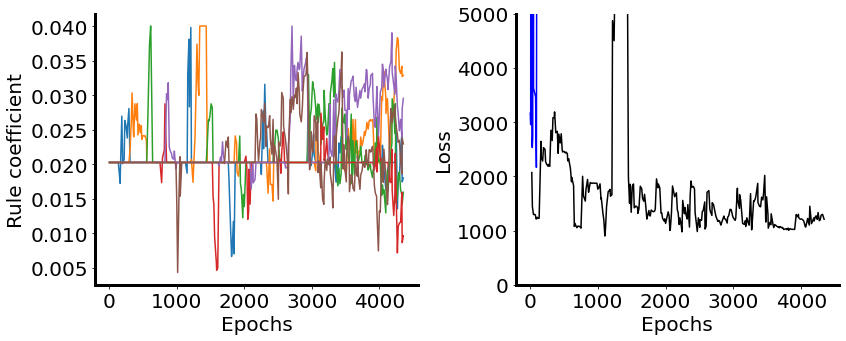

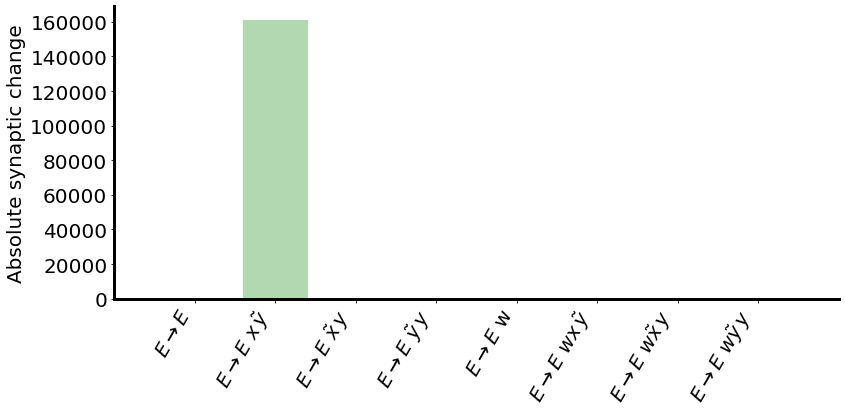

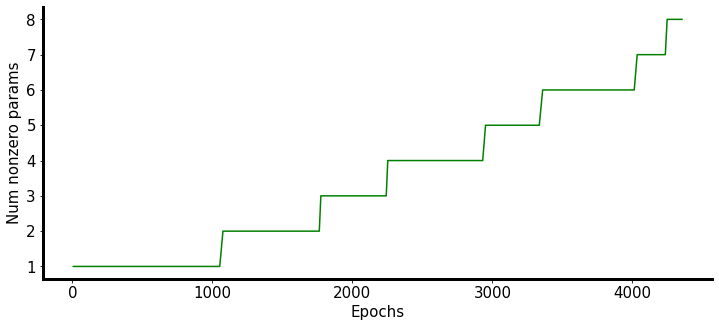

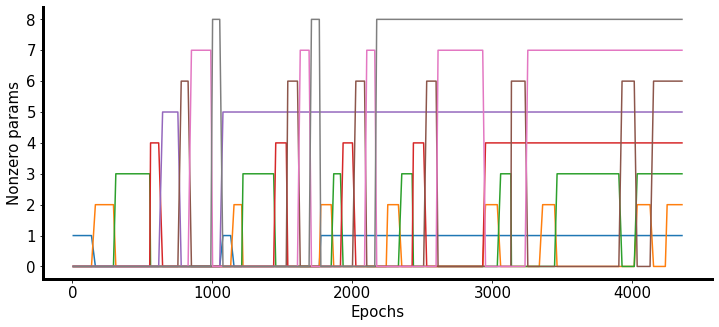

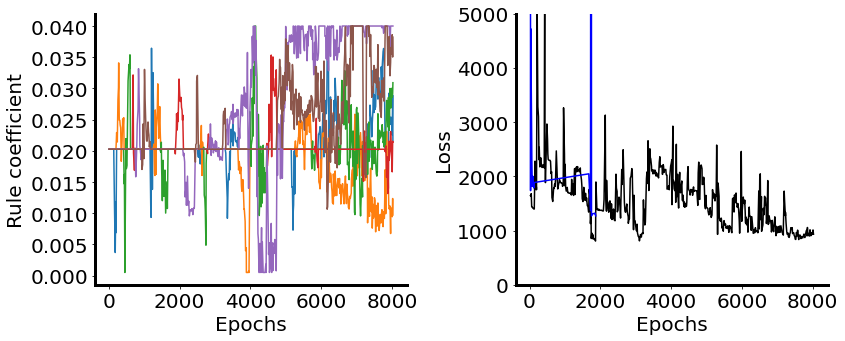

...

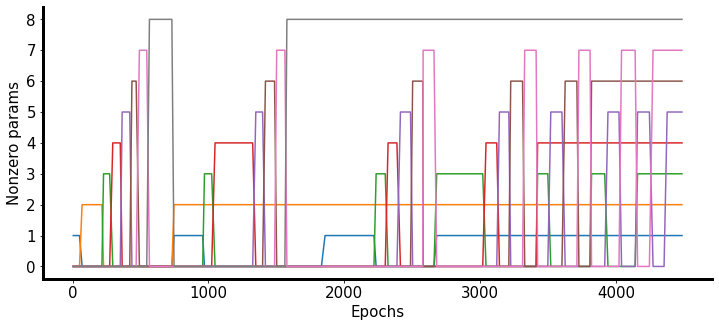

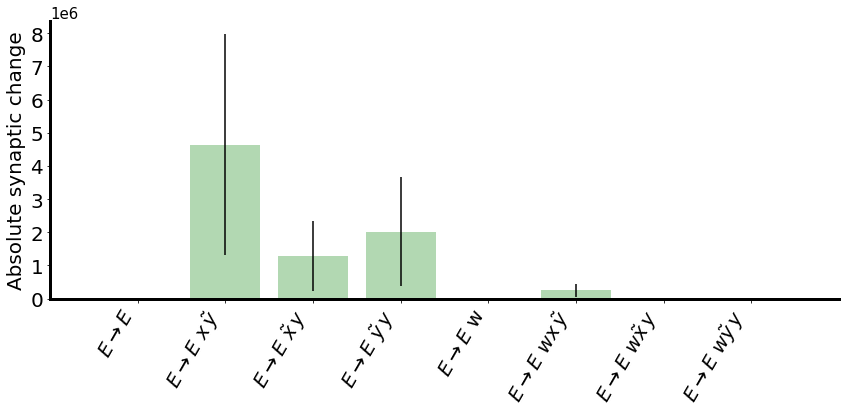

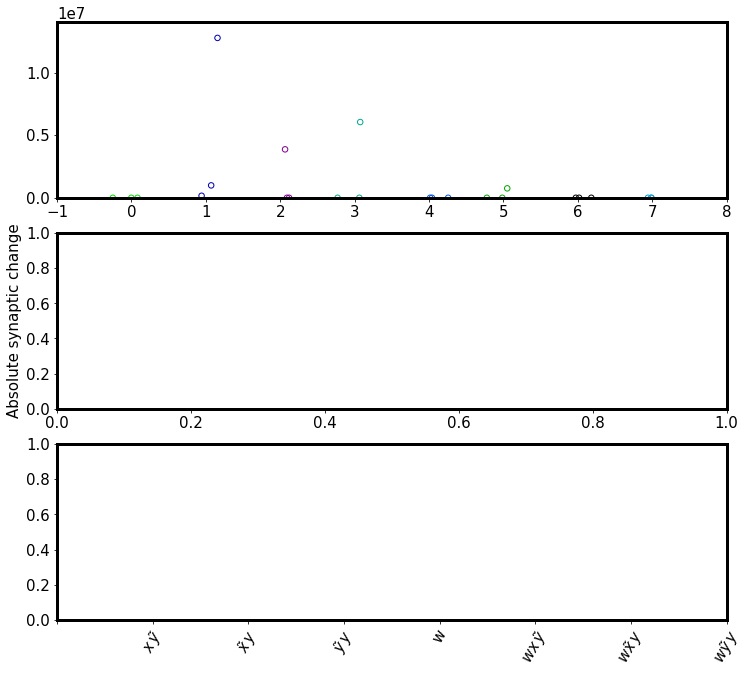

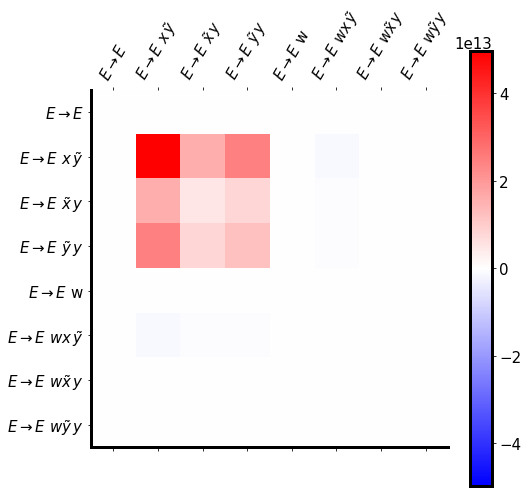

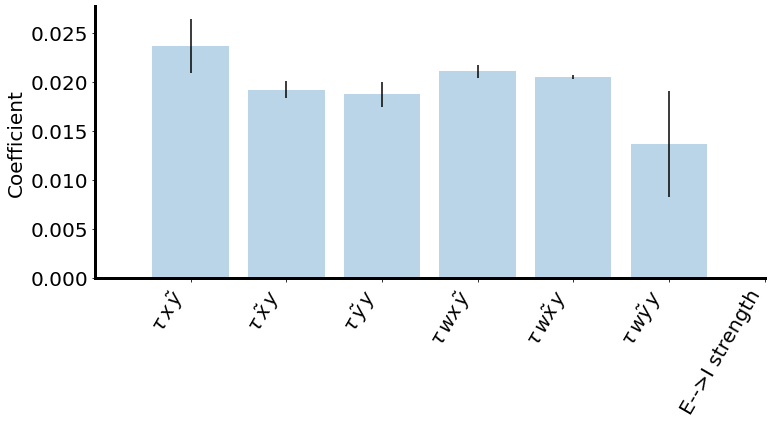

In [15]:
all_files = [
    'stepwise_reduced_set_5_STD_EXPL_1.0_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_8000_2023-08-23_11:03:03.713695',
    'stepwise_reduced_set_5_STD_EXPL_1.0_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_8001_2023-08-23_11:03:03.713766',
    'stepwise_reduced_set_5_STD_EXPL_1.0_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_8002_2023-08-23_11:06:34.021167',
]

plot_all_opt_runs(all_files, 8, 6, 5, l_thresh=2000, n_categories=1, name='ee_unperturbed_fixed_input')

[ 6.79468435e-03  2.12321479e-02 -2.60290484e-03 -7.13255473e-04
 -1.68226843e-03 -9.15789999e-04 -1.50395786e-03  2.02309668e-04
  7.02629626e-03  5.71693932e-03 -5.71409179e-03  1.12840680e-02
  1.47232132e-03  1.25015376e-03 -2.83269851e-03  5.24335699e-05
 -2.46394147e-03  4.67559893e-05  2.83889040e-03  3.01737840e-04
  2.71452219e-02  2.10463602e-02  3.00675741e-02  2.33705135e-02
  1.93427842e-02  4.73759925e-03  2.50197315e-02  2.11575269e-02
  1.49421703e-02  4.00000000e-02  2.89387698e-02  1.27976603e-02
  1.67687494e-02]
decoder_ee_3_bipop_10_STD_EXPL_0.01_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_8000_2023-08-14_15:17:20.017583
[ 1.43262234e-03  1.19107837e-02  1.55497944e-02  5.83886085e-03
 -3.80447336e-04  1.32439438e-02  7.08208573e-03  9.26485295e-05
 -1.25745032e-02 -4.09141130e-03  6.37449819e-05  1.18183122e-02
 -4.63844627e-03 -2.45375320e-02 -7.38706923e-03 -4.04240459e-03
  6.22154542e-03 -5.76341611e-03 -2.92124864e

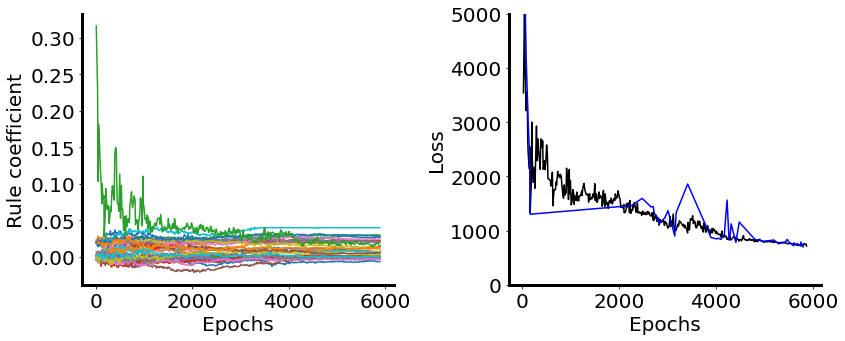

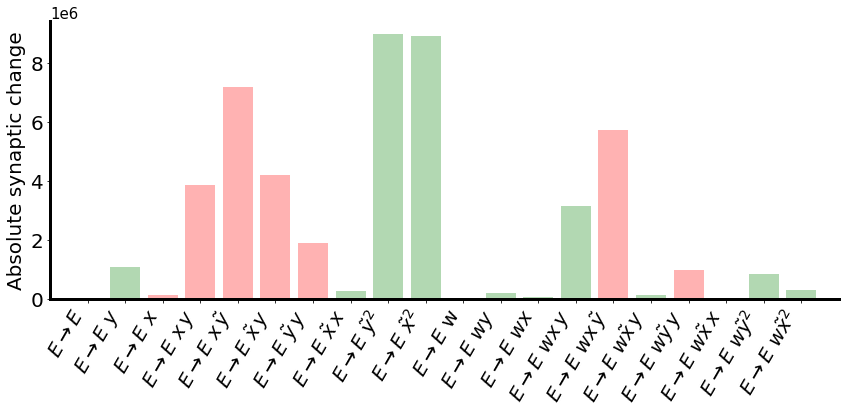

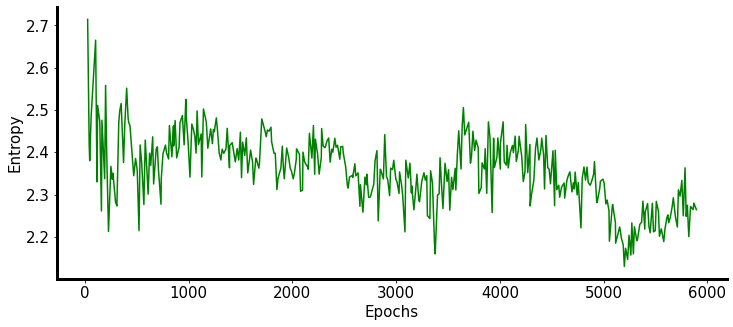

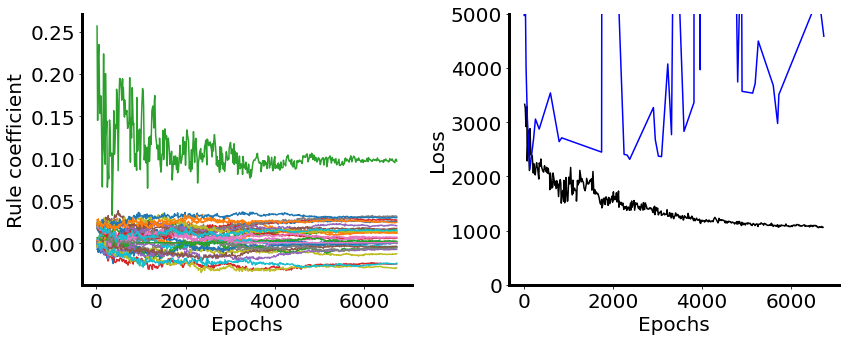

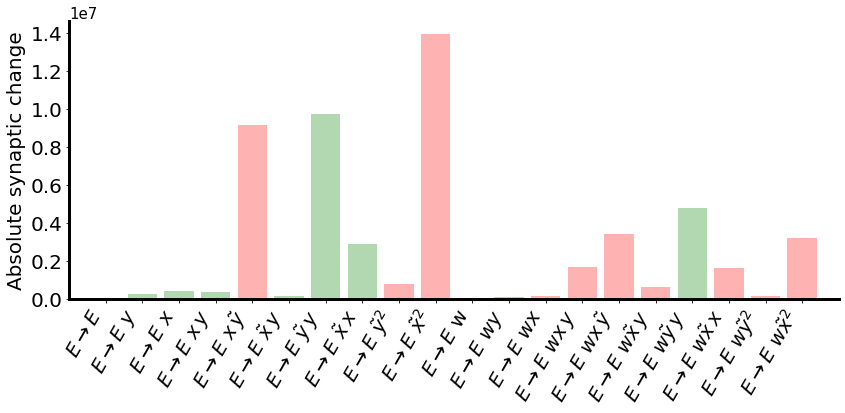

...

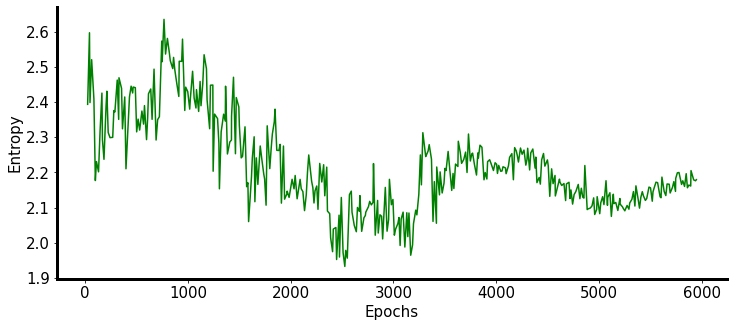

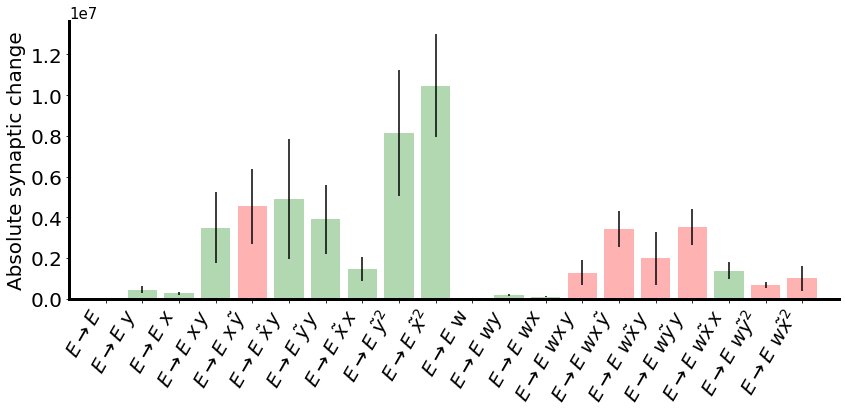

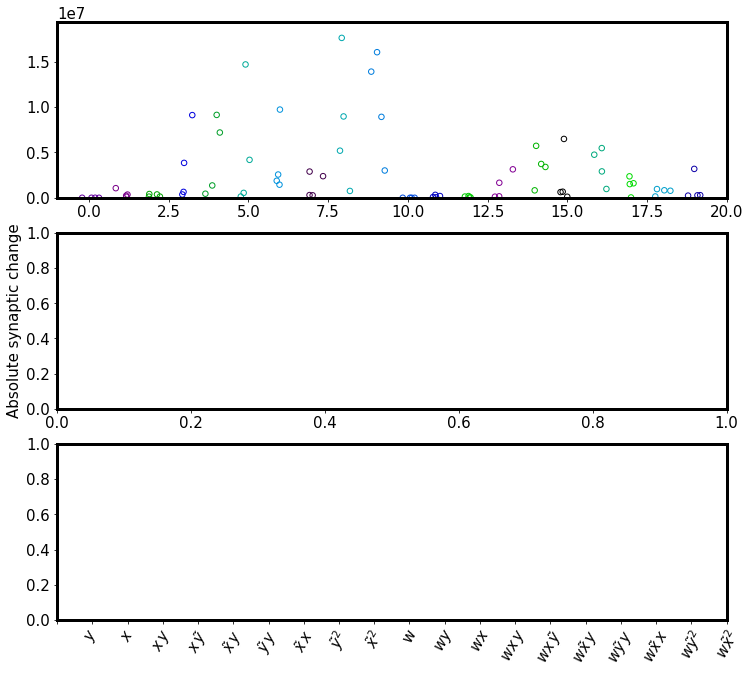

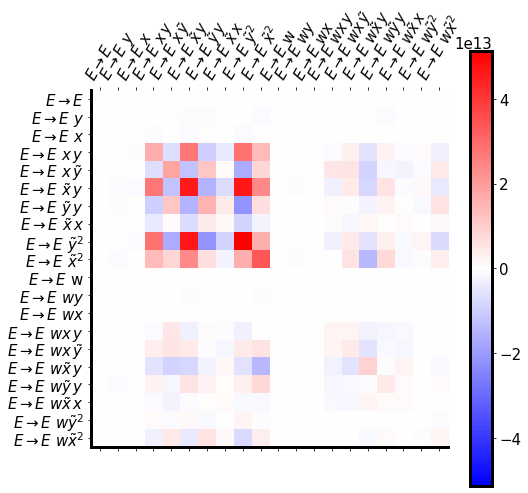

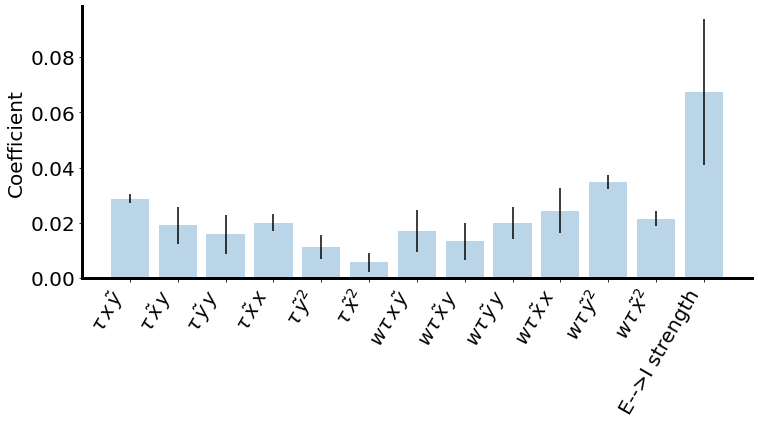

In [6]:
all_files = [
    'decoder_ee_3_bipop_10_STD_EXPL_0.01_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_8000_2023-08-14_15:17:20.017583',
    'decoder_ee_3_bipop_10_STD_EXPL_0.01_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_8001_2023-08-14_15:18:53.397589',
    'decoder_ee_3_bipop_10_STD_EXPL_0.01_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_8002_2023-08-14_15:42:32.830129',
    'decoder_ee_3_bipop_10_STD_EXPL_0.01_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_8003_2023-08-14_15:42:11.518487',
    'decoder_ee_3_bipop_10_STD_EXPL_0.01_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_8004_2023-08-14_16:04:36.837507',
]

plot_all_opt_runs(all_files, 20, 13, 10, l_thresh=2000, n_categories=1, name='ee_unperturbed_fixed_input')

[-0.02593973  0.03855157  0.01994394  0.01305723 -0.02887059 -0.019063
  0.02047538  0.0331929  -0.00768862 -0.0233789   0.00159089  0.01031503
  0.04519183 -0.02906044 -0.00171893 -0.00978406 -0.00226451 -0.02505668
  0.01042216 -0.02208379 -0.00221125  0.00697914  0.00892732 -0.00321464
 -0.00637943  0.00025158  0.00125037  0.01743813  0.0107207   0.0081109
 -0.03833297 -0.01452484  0.0058765   0.01804231  0.02043897  0.04
  0.00385677  0.01018019  0.0005      0.0189255   0.01189861  0.0005
  0.03088465  0.01745987  0.01919699  0.0336748   0.0005      0.0005
  0.03238949  0.0245424   0.06819305]
decoder_ee_3_extended_bipop_d_10_STD_EXPL_0.01_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7004_2023-08-11_11:26:38.954727
[ 0.00860635  0.01035062 -0.01431292 -0.00215169  0.02489147  0.01516452
  0.01531669  0.01865596 -0.01954555 -0.00093428  0.01193645 -0.01766555
  0.01576813 -0.03465105  0.00416709  0.00863536 -0.00269228  0.01973755
 -0.0161

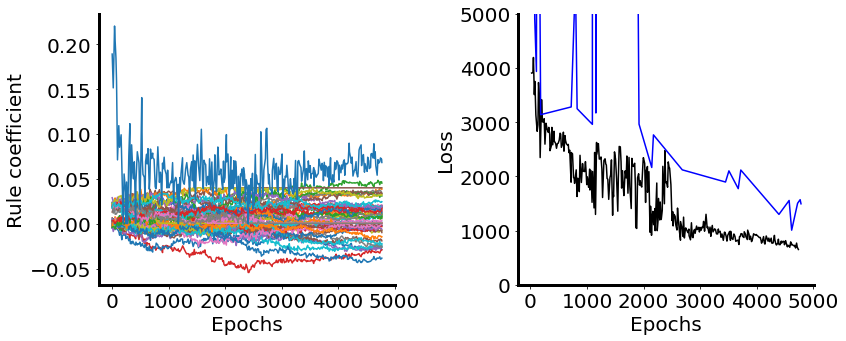

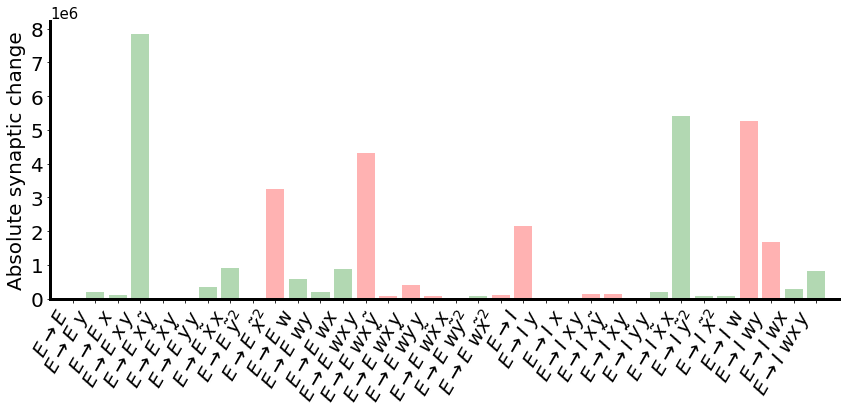

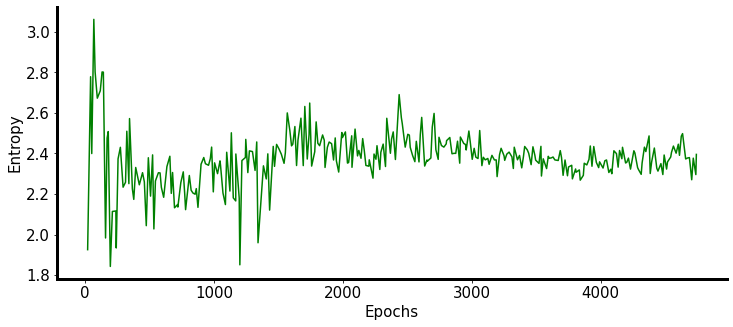

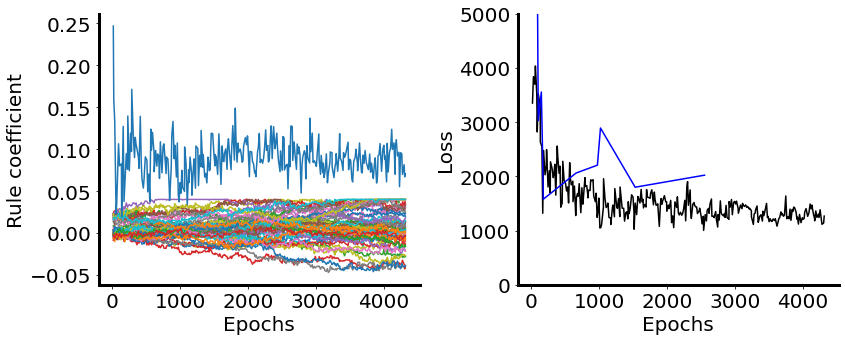

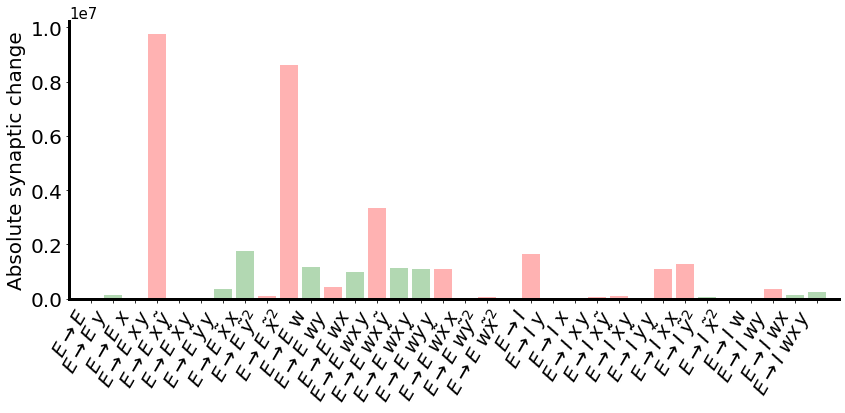

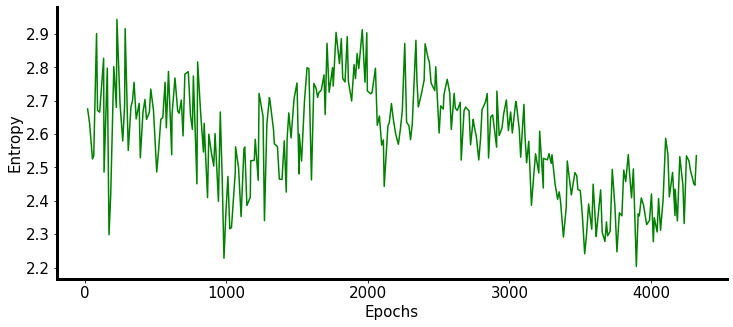

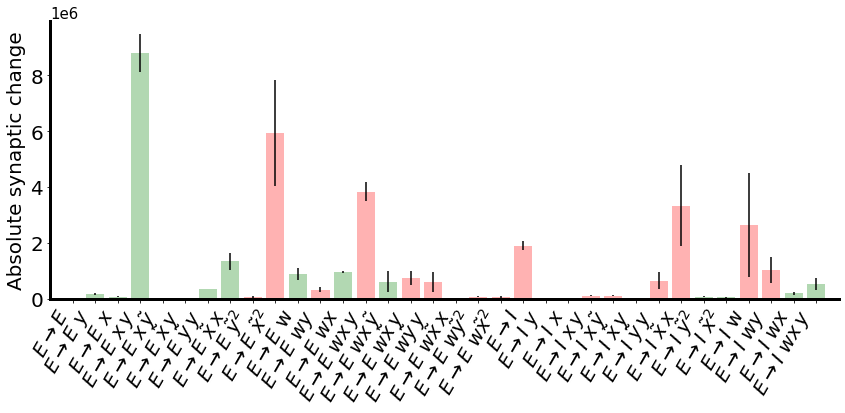

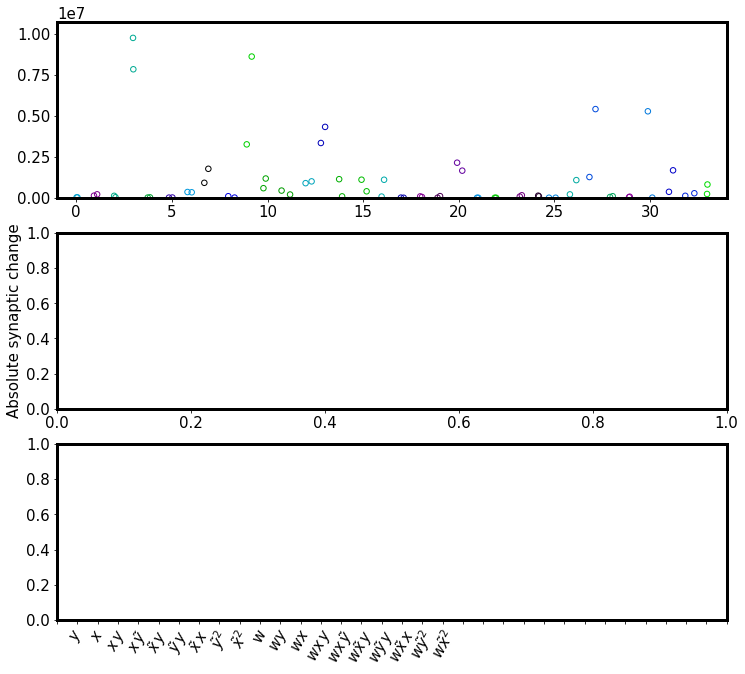

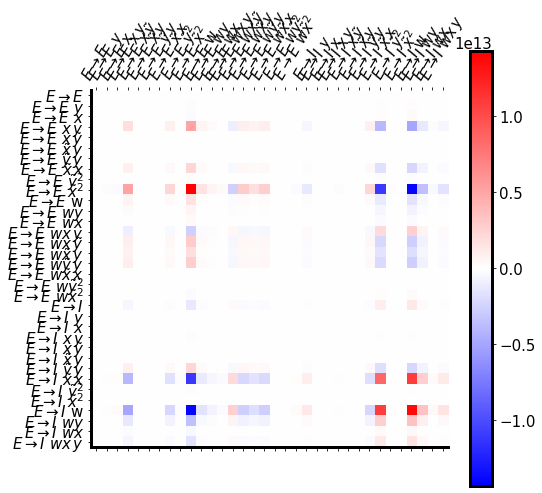

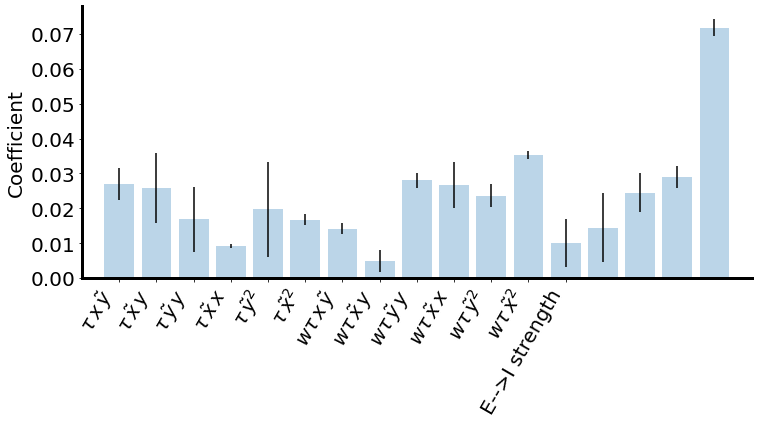

In [9]:
all_files = [
    'decoder_ee_3_extended_bipop_d_10_STD_EXPL_0.01_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7004_2023-08-11_11:26:38.954727',
    'decoder_ee_3_extended_bipop_d_10_STD_EXPL_0.01_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7005_2023-08-11_11:26:56.492828',
]

plot_all_opt_runs(all_files, 34, 17, 10, l_thresh=2000, n_categories=1, name='ee_unperturbed_fixed_input')

[ 0.          0.          0.          0.          1.33673357  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.         -0.42454255
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.03558807  0.          0.          0.          0.02025     0.02025
  0.02025     0.02025     0.02025     0.02025     0.02025     0.02025
  0.02247704  0.02025     0.02025     0.02025     0.02174542  0.02025
  0.02025     0.02025     0.11948505]


ValueError: need at least one array to stack

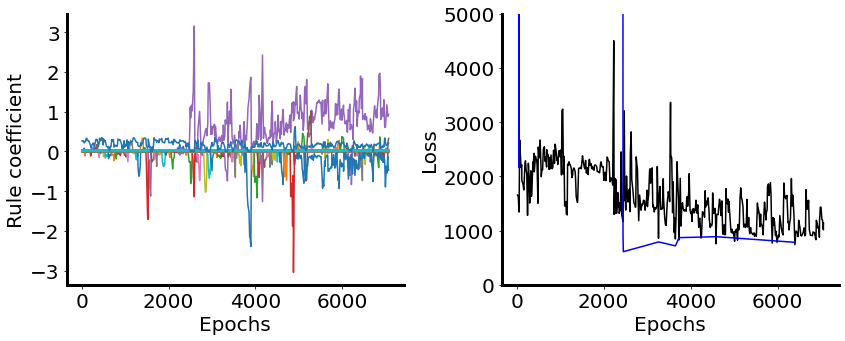

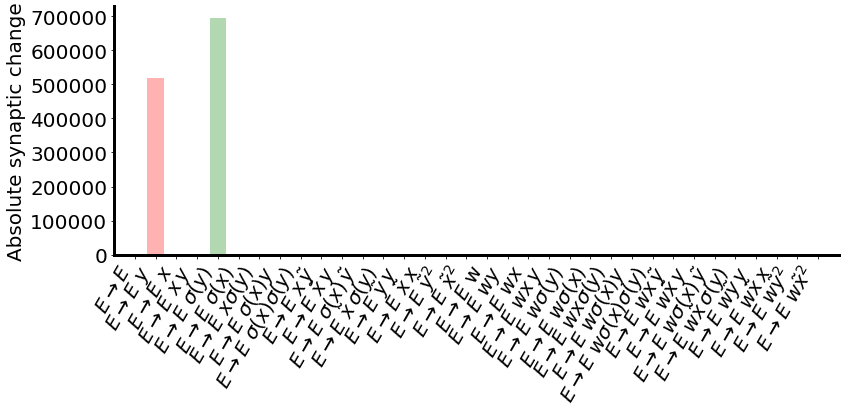

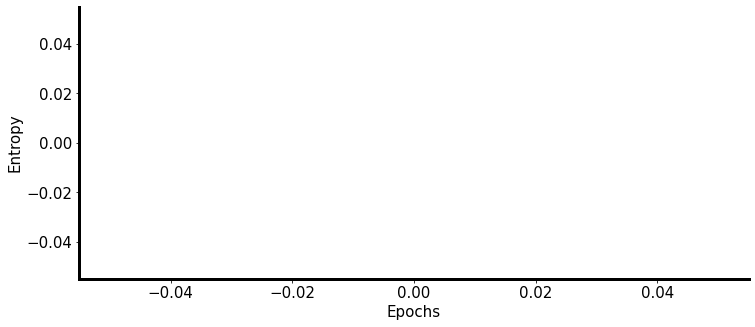

In [8]:
all_files = [
    'decoder_ee_3_stepwise_5_STD_EXPL_1.0_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7002_2023-08-12_13:11:53.624300',
]

plot_all_opt_runs(all_files, 34, 17, 5, l_thresh=400, n_categories=1, name='ee_unperturbed_fixed_input')

[0.         0.         0.         0.         0.07084834 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.02025    0.02025
 0.02025    0.02025    0.02025    0.02025    0.02025    0.02025
 0.02025    0.02025    0.02025    0.02025    0.02025    0.02025
 0.02025    0.02025    0.15806855]
decoder_ee_3_stepwise_5_STD_EXPL_1.0_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7000_2023-08-11_15:55:12.115702
[0.         0.         0.         0.         0.08909018 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.

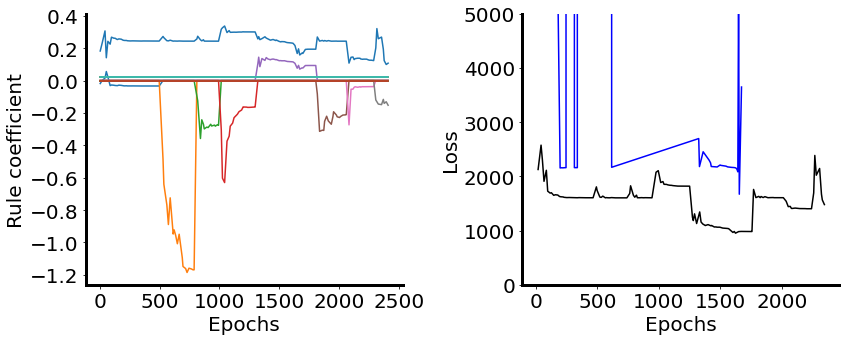

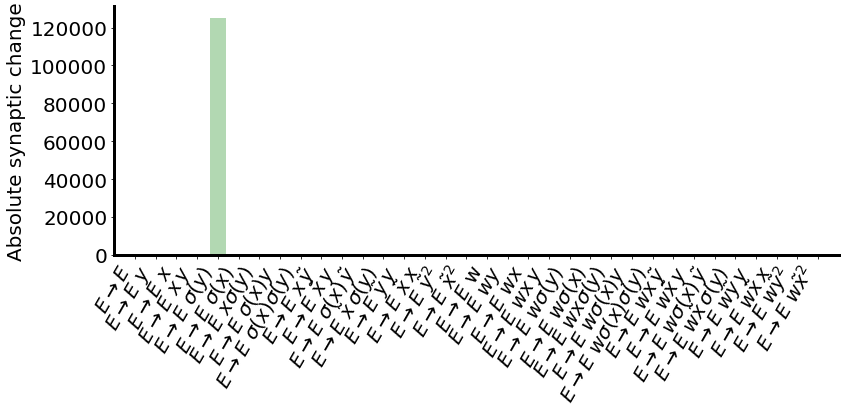

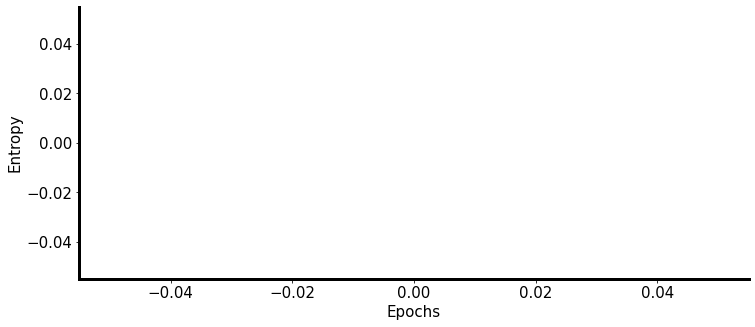

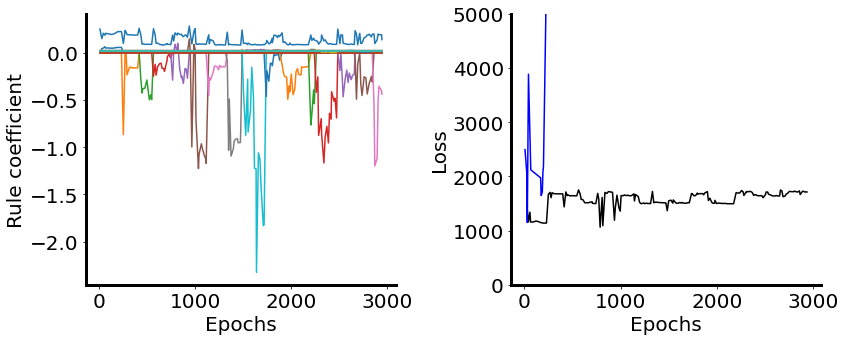

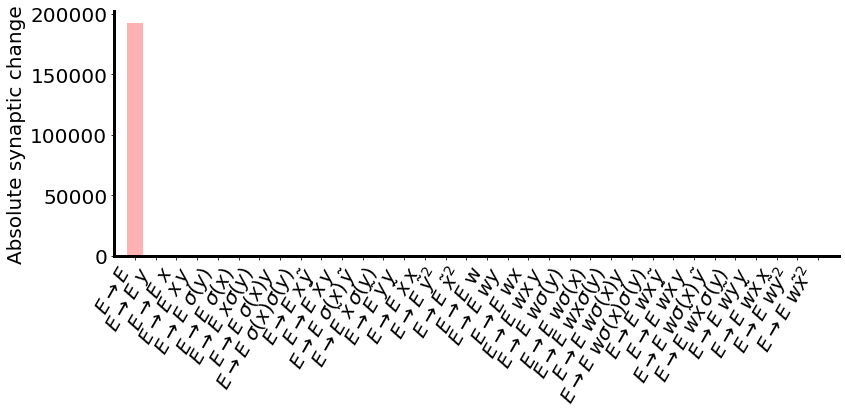

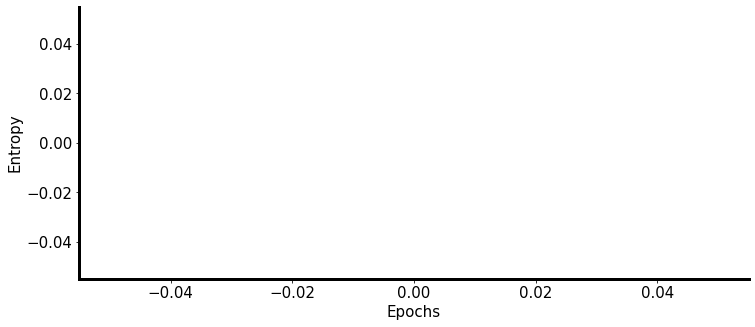

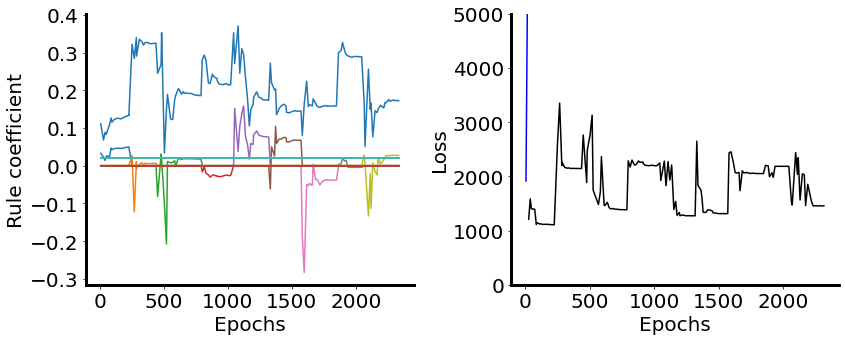

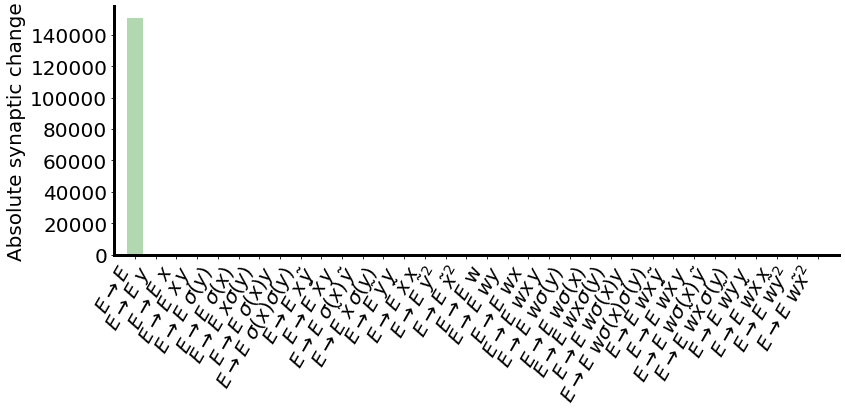

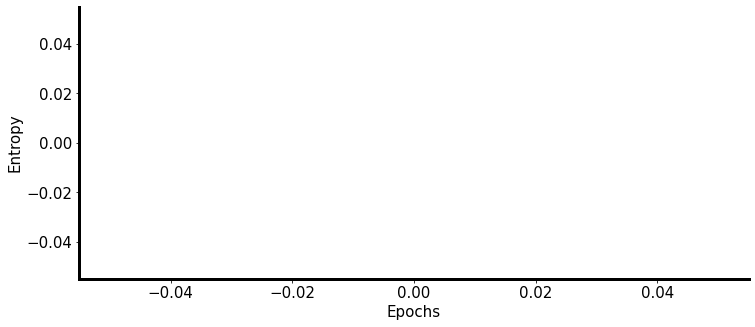

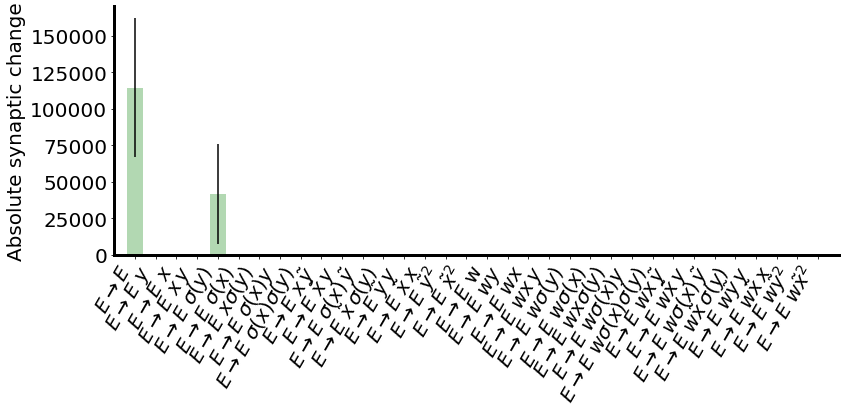

In [ ]:
all_files = [
    'decoder_ee_3_stepwise_5_STD_EXPL_1.0_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7000_2023-08-11_15:55:12.115702',
    'decoder_ee_3_stepwise_5_STD_EXPL_1.0_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7001_2023-08-11_15:56:24.870515',
    'decoder_ee_3_stepwise_5_STD_EXPL_1.0_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7002_2023-08-11_15:58:06.982668',
]

plot_all_opt_runs(all_files, 34, 17, 5, l_thresh=2000, n_categories=1, name='ee_unperturbed_fixed_input')

[-1.67287969e-02  1.33126508e-02  5.17440978e-03  1.49263782e-02
 -6.45902181e-03 -3.44619731e-05  7.22611546e-03  1.96890459e-02
  4.42647083e-03 -6.77048293e-03  1.66294959e-02  7.30951885e-03
  2.44522690e-02 -4.54568010e-02 -1.40079799e-02 -5.74176179e-03
  5.05770129e-03 -6.11976698e-03  2.17755187e-03 -5.89757862e-03
 -1.73919335e-02  1.47196844e-02  8.66807950e-03  5.33172536e-03
 -8.33754468e-03  3.17325095e-03 -2.00912376e-02  6.42614301e-03
  6.83076894e-03 -4.49608344e-03 -1.78100783e-02 -3.70912498e-03
  1.17946284e-02  1.39493988e-02  8.58812920e-03  4.00000000e-02
  5.56296086e-03  1.07947057e-02  5.00000000e-04  1.68254151e-02
  1.05415324e-02  2.54379376e-02  3.40040984e-02  1.32059521e-02
  3.77722533e-02  2.60379791e-02  5.00000000e-04  8.38662233e-03
  4.00000000e-02  2.44566701e-02  4.47803734e-02]
[ 0.00131727  0.01172221 -0.00705316  0.00205125  0.01049282  0.00099578
  0.00752617  0.02025235 -0.01249246 -0.00395121  0.01054353 -0.00352014
  0.0060134  -0.02413453

ValueError: need at least one array to stack

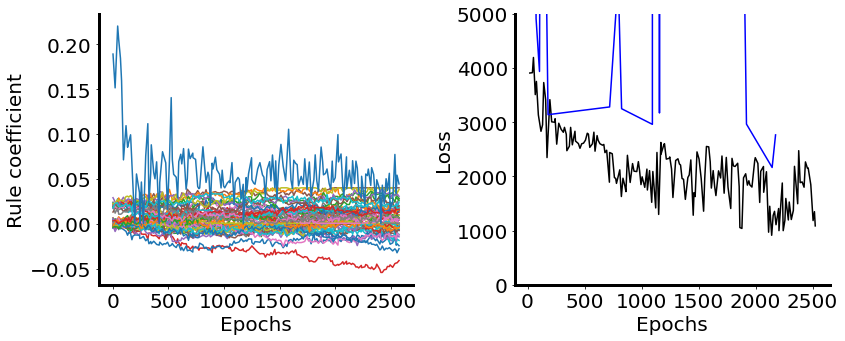

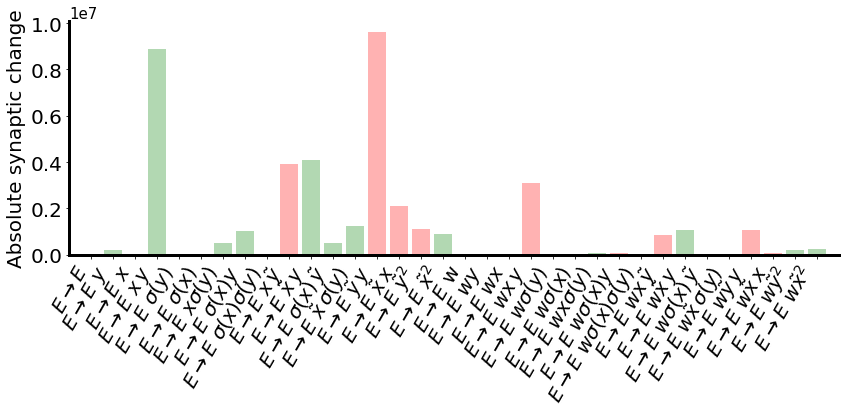

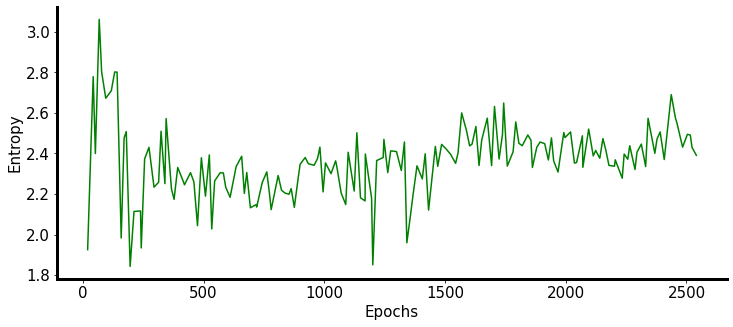

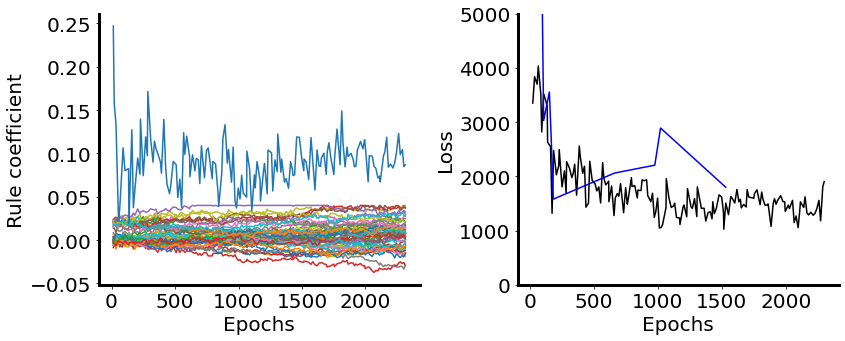

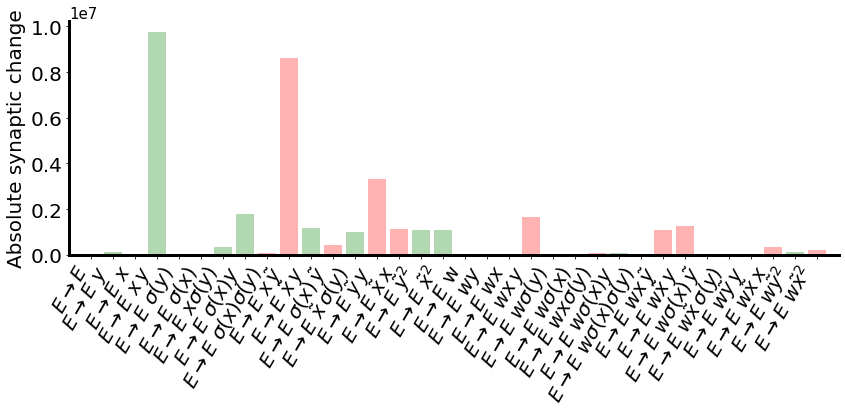

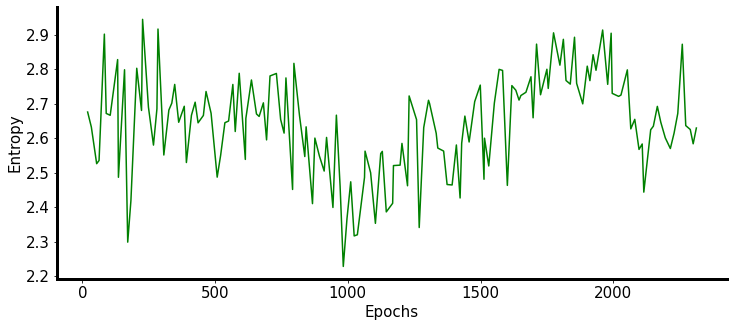

In [15]:
all_files = [
    'decoder_ee_3_extended_bipop_d_10_STD_EXPL_0.01_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7004_2023-08-11_11:26:38.954727',
    'decoder_ee_3_extended_bipop_d_10_STD_EXPL_0.01_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7005_2023-08-11_11:26:56.492828',
]

plot_all_opt_runs(all_files, 34, 17, 10, l_thresh=400, n_categories=1, name='ee_unperturbed_fixed_input')

[-4.40043350e-03  3.39367721e-03  2.28410984e-03  1.72663371e-03
  1.02594502e-02 -2.45939618e-03  3.77396148e-03 -8.09917576e-04
  4.04502661e-03 -2.41314645e-03  1.03720352e-03  2.77523367e-03
  3.27238120e-03  2.46873589e-03  1.97441683e-03 -7.74262741e-03
  3.36148266e-03 -4.52726070e-03 -1.97767619e-03 -1.16492038e-02
 -4.00168771e-03 -7.07420758e-03  2.11407248e-05 -4.08907571e-03
 -5.51297812e-04 -5.11141551e-03 -1.88517892e-03  2.54938641e-03
 -1.67502893e-03  1.02516210e-02 -3.39941553e-03 -1.24975882e-03
 -8.51826313e-03 -4.90242223e-03  2.08849070e-02  2.66216236e-02
  1.82327011e-02  2.49605667e-02  2.08032552e-02  4.82396357e-03
  2.71803931e-02  2.61322881e-02  2.55951056e-02  1.24156026e-02
  2.69448136e-02  2.49682892e-02  1.95798943e-02  1.45039002e-02
  1.33946506e-02  1.85195306e-02  7.27894534e-02]
[ 8.55992301e-04 -5.70009707e-03  2.87425458e-03 -3.72635876e-03
 -4.58875369e-03  3.78923603e-03  2.35045545e-02  6.02242211e-03
 -3.01740037e-03 -4.17719450e-04  2.6564

ValueError: need at least one array to stack

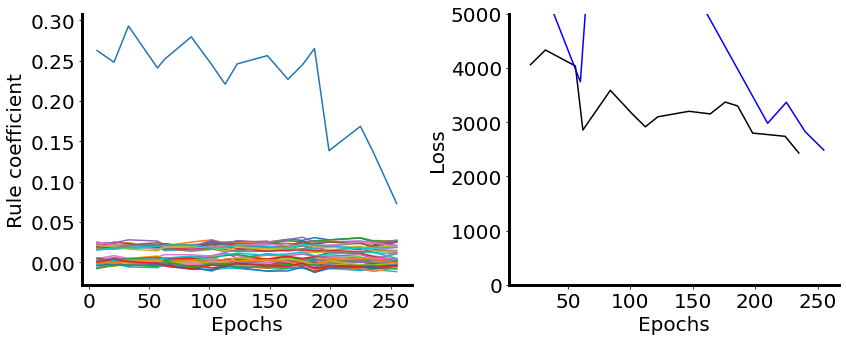

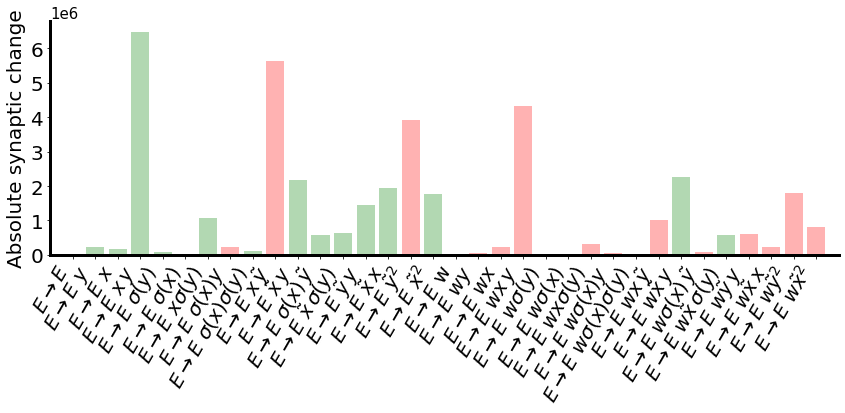

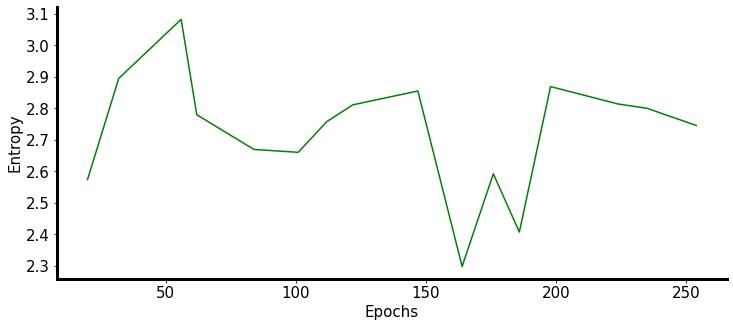

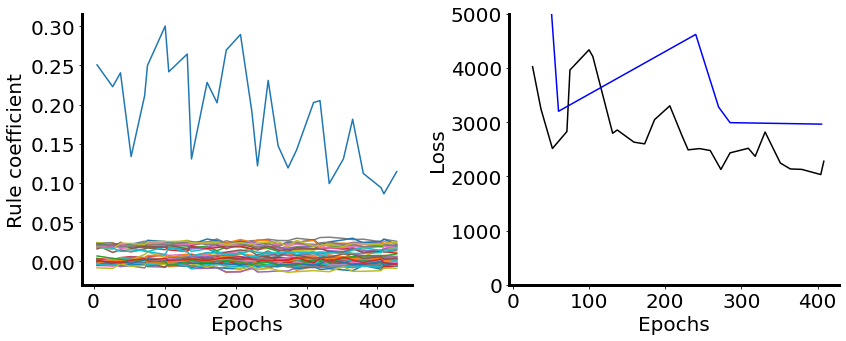

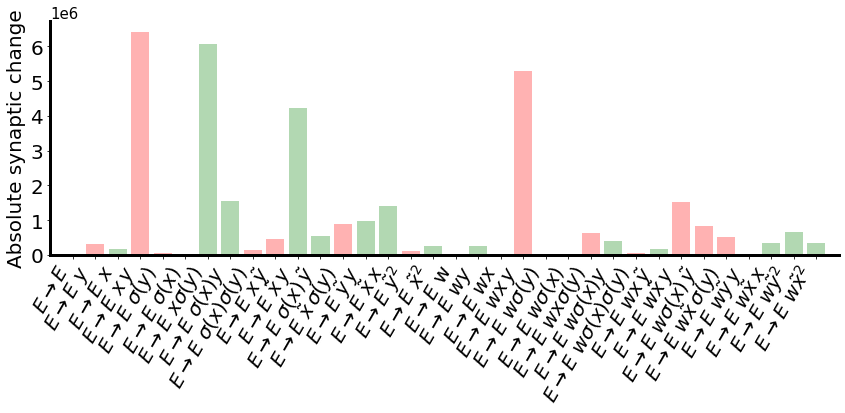

...

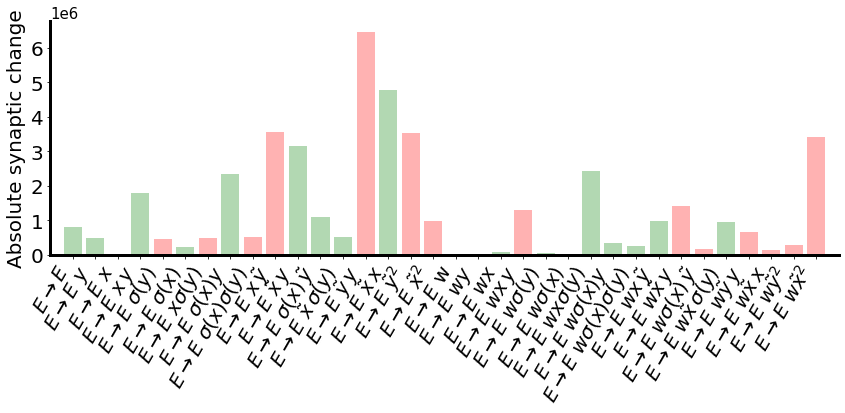

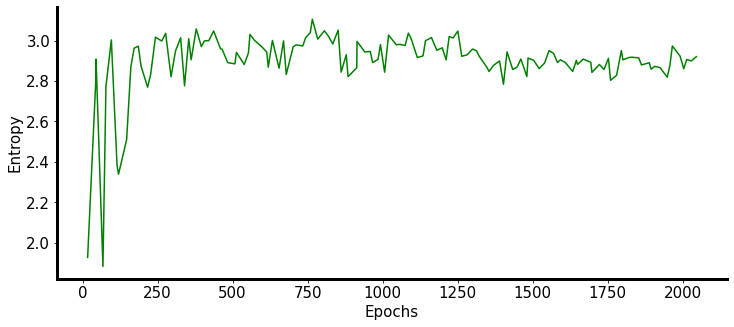

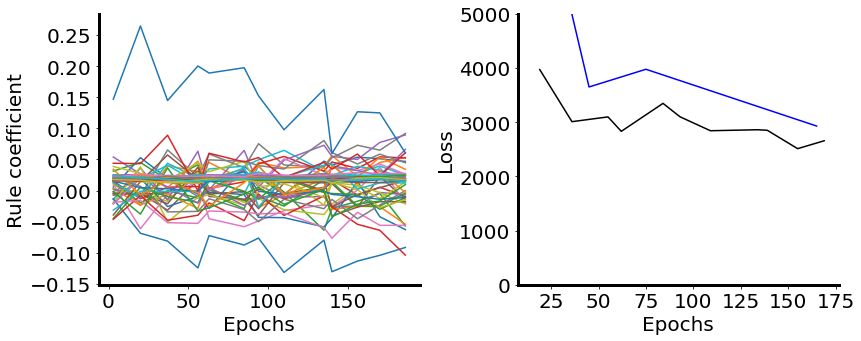

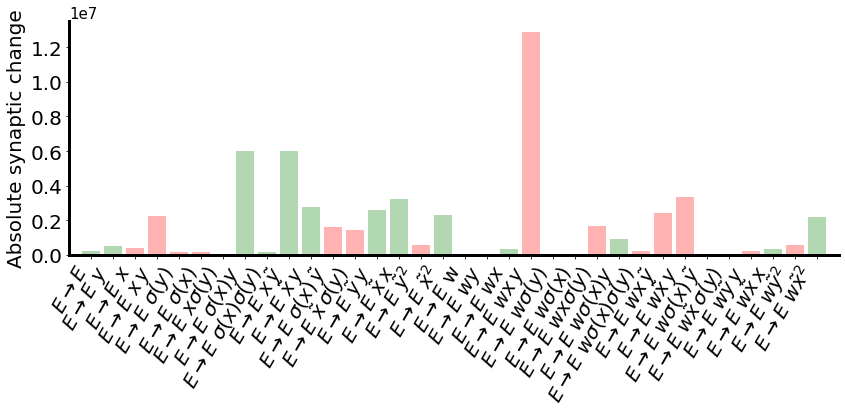

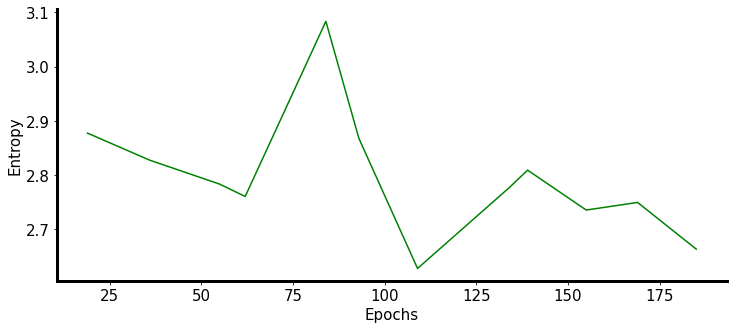

In [4]:
all_files = [
    'decoder_ee_3_extended_bipop_d_10_STD_EXPL_0.01_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7000_2023-08-10_12:20:02.220006',
    'decoder_ee_3_extended_bipop_d_10_STD_EXPL_0.01_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7002_2023-08-10_12:23:03.342666',
    'decoder_ee_3_extended_bipop_d_10_STD_EXPL_0.1_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7001_2023-08-10_12:22:48.775323',
    'decoder_ee_3_extended_bipop_d_10_STD_EXPL_0.1_50.0_100.0_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7003_2023-08-10_12:25:10.784297',
]

plot_all_opt_runs(all_files, 34, 17, 10, l_thresh=400, n_categories=1, name='ee_unperturbed_fixed_input')

[-0.1696206  -0.3078412   0.02064905 -0.05895121 -0.33466088  0.5425126
 -0.20018401  0.15732013 -0.35888267  0.00472414 -0.01578566 -0.31446324
 -0.02349769  0.25508176  0.436977    0.17219481  0.43233507 -0.7869626
  0.43386843 -0.18557539 -0.52664872 -0.15172101  0.22194378 -0.31907698
 -0.13967302 -0.14703698 -0.22357266 -0.65253549  0.66604669 -0.28723654
  0.26370176  0.07162093 -0.1314752   0.17974431  0.03328753  0.02938855
  0.01993468  0.01102121  0.01660206  0.03352812  0.01103734  0.01627114
  0.03216745  0.02123481  0.01729604  0.01495188  0.02645998  0.02069395
  0.01325296  0.01141664  0.1311682 ]
[-0.25585287  0.53100497 -0.50675481 -0.20969943  0.17308863 -0.52231867
  0.95215944  0.23602031 -0.00189601 -0.27799066  0.36475746  0.24580339
  0.41210201  0.33973396  0.43747841 -0.52395313 -0.05510191  0.03484518
  0.03020996 -0.28568465 -0.52999467  0.05298121  0.22827679 -0.08177357
  0.30490411  0.92792015 -0.01699695  0.13365089 -0.24766088 -0.9819297
 -0.76040027 -0.

ValueError: need at least one array to stack

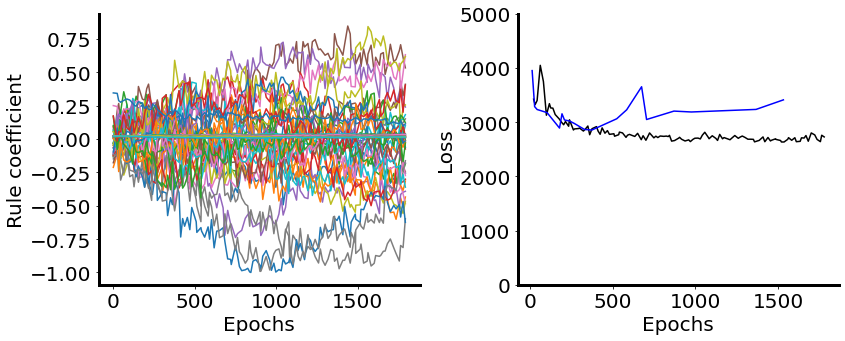

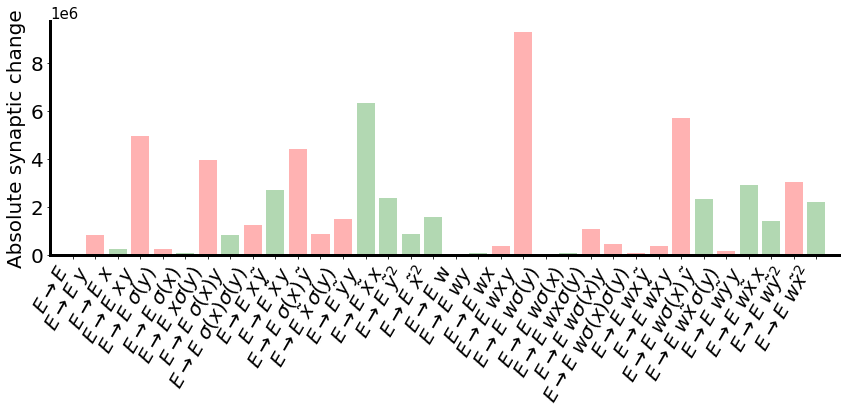

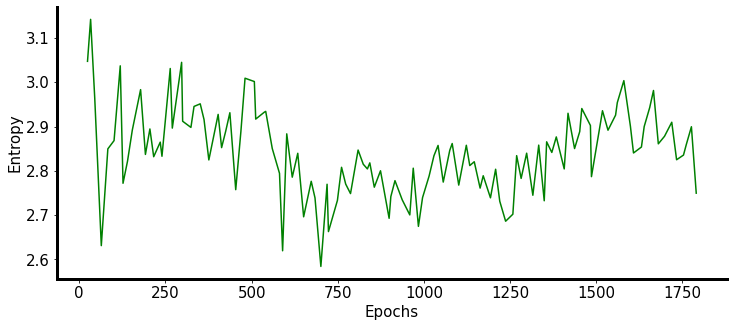

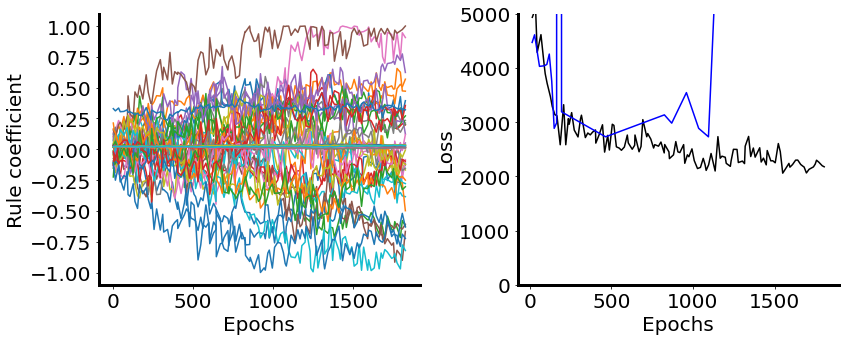

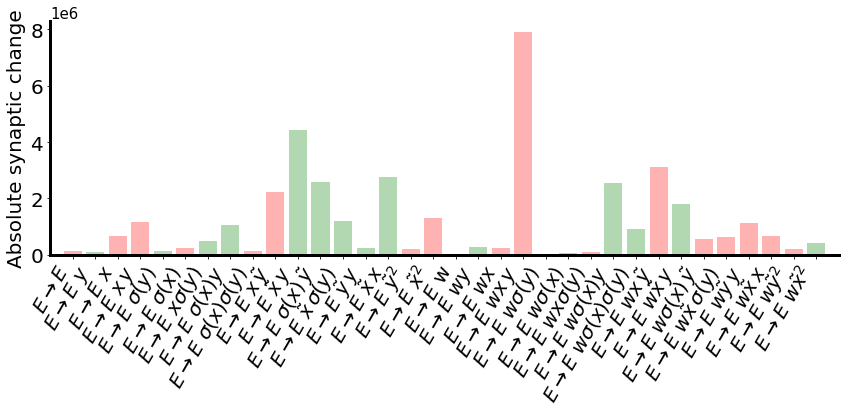

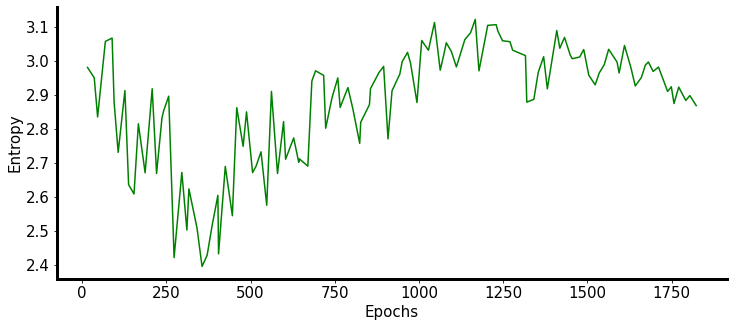

In [4]:
all_files = [
    'decoder_ee_3_extended_bipop_c_10_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7007_2023-08-09_13:59:57.860110',
    'decoder_ee_3_extended_bipop_c_10_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7008_2023-08-09_14:00:51.474313',
]

plot_all_opt_runs(all_files, 34, 17, 10, l_thresh=400, n_categories=1, name='ee_unperturbed_fixed_input')

[-0.3569598  -0.03676113 -0.24464931  0.0013269   0.05271948 -0.0087815
  0.59730682  0.2770444   0.19548033  0.24769233  0.35292168 -0.17960582
  0.05491099 -0.17185954 -0.07266673 -0.26731339 -0.14326262  0.00907972
 -0.30987096  0.23666845 -0.29978248 -0.40126516 -0.25148181 -0.14873123
  0.12488498 -0.03827407 -0.03995116 -0.26321528  0.07105086 -0.08983858
 -0.40873115 -0.00385876  0.06313162 -0.39291439  0.00882216  0.02410214
  0.01218873  0.01935876  0.02260241  0.02598922  0.02105098  0.02246118
  0.01652815  0.02535164  0.01667852  0.02894914  0.00881676  0.0200564
  0.02550284  0.03237395  0.22239553]
[ 0.30966846 -0.04461709 -0.05978951 -0.12308357 -0.07718811 -0.83030873
  0.03700546 -0.15597259  0.88447    -0.51131483  0.87430781 -0.08363309
  0.14823732 -0.8050797  -0.14772313 -0.01266048 -0.14545802  0.34931974
 -0.96108236 -0.68590007 -0.12366664  0.13174913 -0.24408159  0.41042819
  0.92618417 -0.33342225 -0.23328817 -0.94883384  0.04140536 -0.07296539
 -0.57643602  0

ValueError: need at least one array to stack

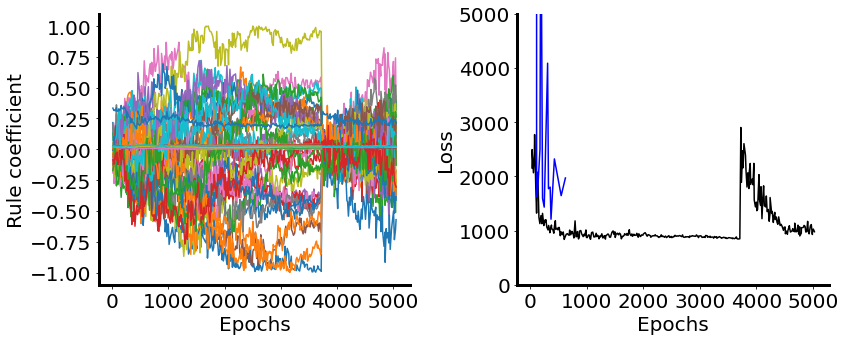

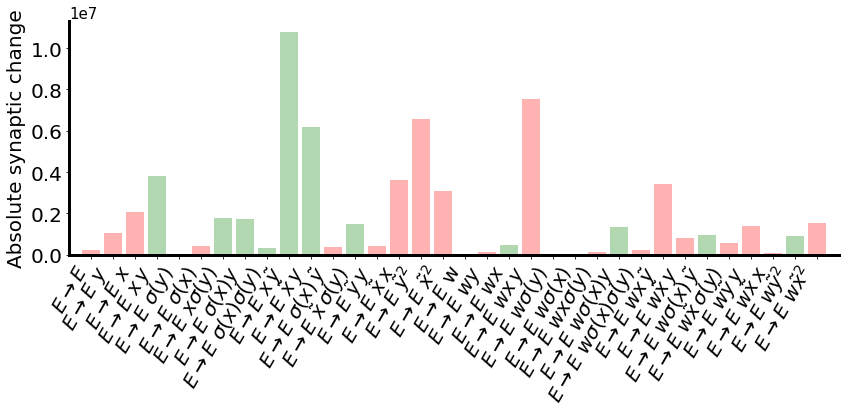

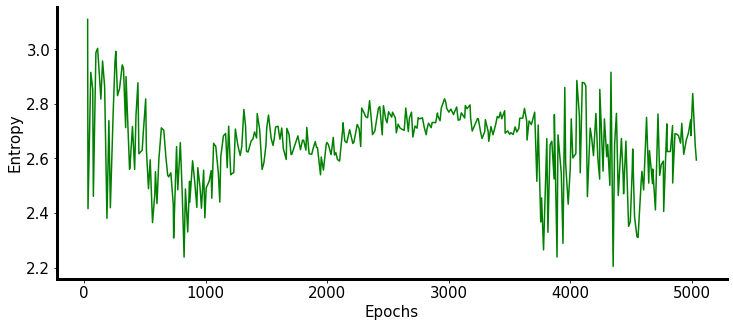

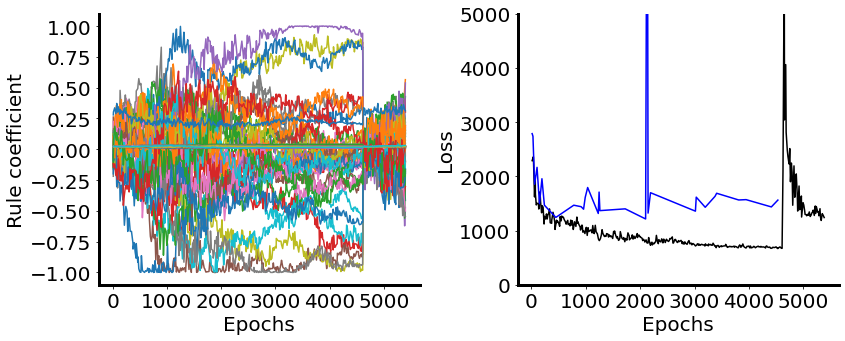

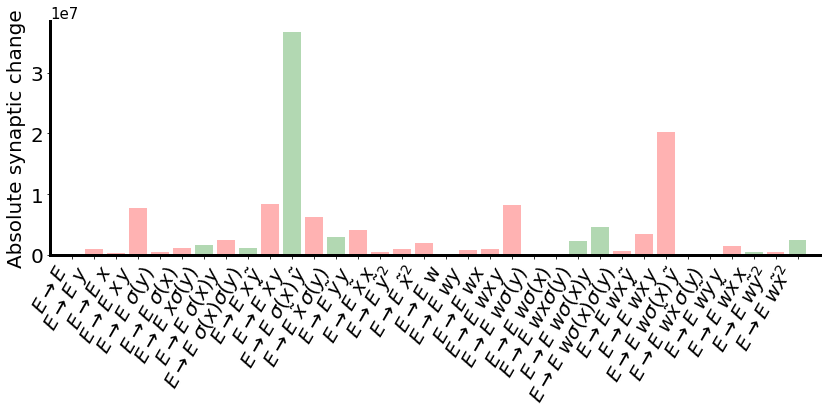

...

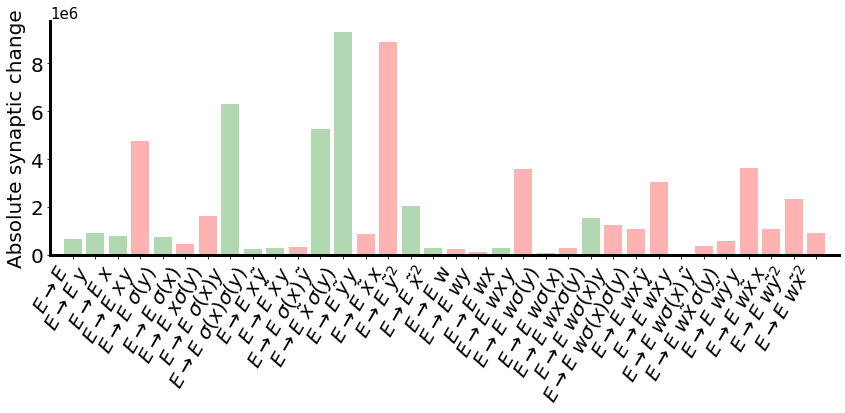

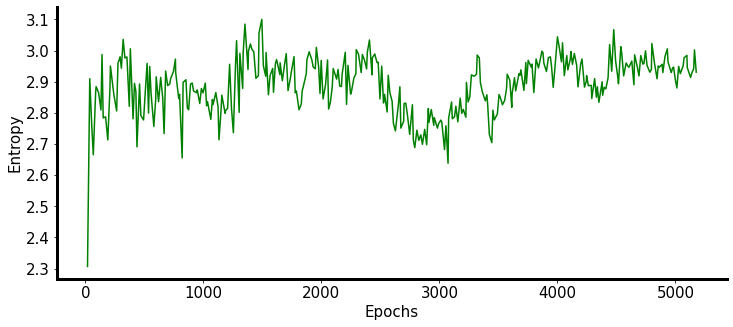

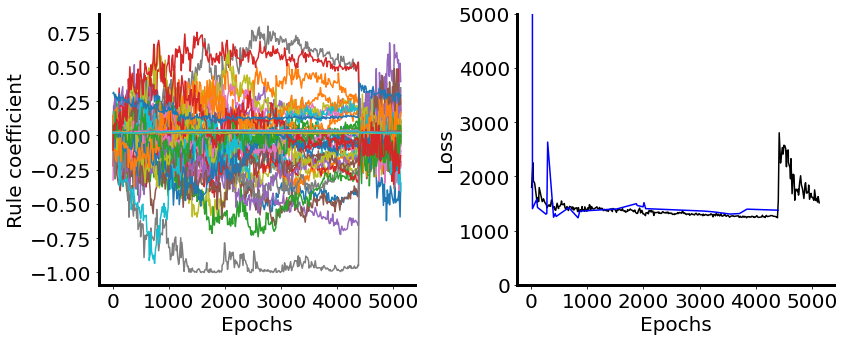

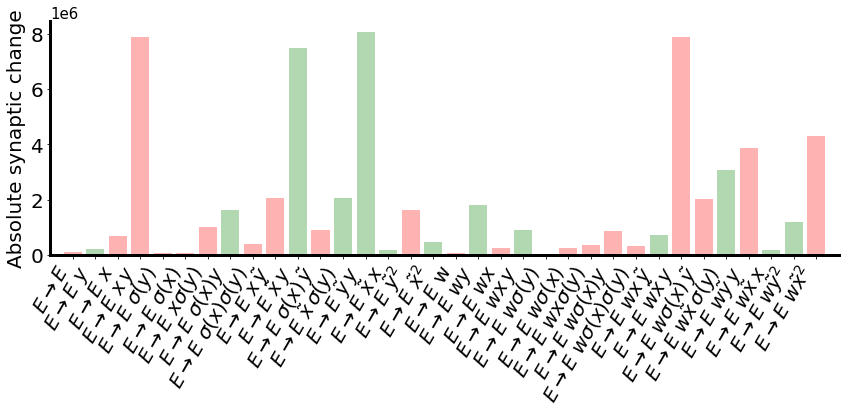

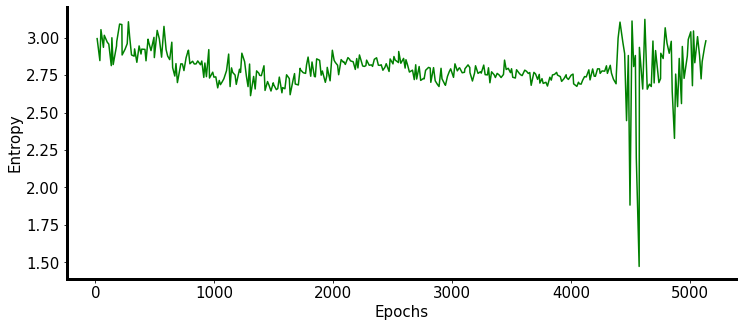

In [5]:
all_files = [
    'decoder_ee_3_extended_bipop_c_5_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7007_2023-08-09_00:27:20.979835',
    'decoder_ee_3_extended_bipop_c_5_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7008_2023-08-09_00:27:20.979761',
    'decoder_ee_3_extended_bipop_c_5_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7009_2023-08-09_00:28:32.977157',
    'decoder_ee_3_extended_bipop_c_5_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7010_2023-08-09_00:28:32.977139',
]

plot_all_opt_runs(all_files, 34, 17, 5, l_thresh=400, n_categories=1, name='ee_unperturbed_fixed_input')

[ 0.03790081  0.03028604 -0.08687086  0.06839131  0.06773508 -0.05450368
  0.15887077  0.09568491  0.00383115  0.06260843  0.04803875 -0.03102431
  0.10497895 -0.09496926  0.07143206  0.0117956  -0.05262664 -0.00596564
  0.08410824 -0.01436199 -0.1372416  -0.0353339   0.05943669  0.0459523
 -0.00776793  0.02010138 -0.05120967 -0.06048179 -0.01672133  0.05627327
 -0.09435403 -0.03562898  0.00069767 -0.17578996  0.02076458  0.02125261
  0.0206934   0.02158343  0.01805512  0.02106787  0.02128072  0.02088642
  0.02050405  0.02270034  0.02108978  0.02050762  0.02223474  0.01997119
  0.01879519  0.02105895  0.29454991]
[ 0.13817426 -0.07055959  0.01776165 -0.06381706 -0.07200935 -0.01361362
  0.02257006  0.14701279  0.01745497  0.03070576  0.08278247 -0.00665006
  0.13630244  0.04928471 -0.09736338 -0.18880655  0.04527838  0.02913492
 -0.19543699 -0.12909281 -0.00101865 -0.12500516 -0.08402288  0.1614213
 -0.16503374 -0.03231085 -0.1473486  -0.12014254  0.13050836 -0.00136655
 -0.12274446  0

ValueError: need at least one array to stack

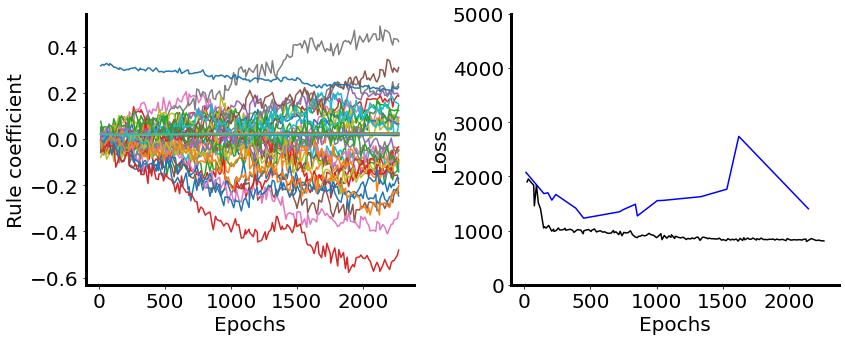

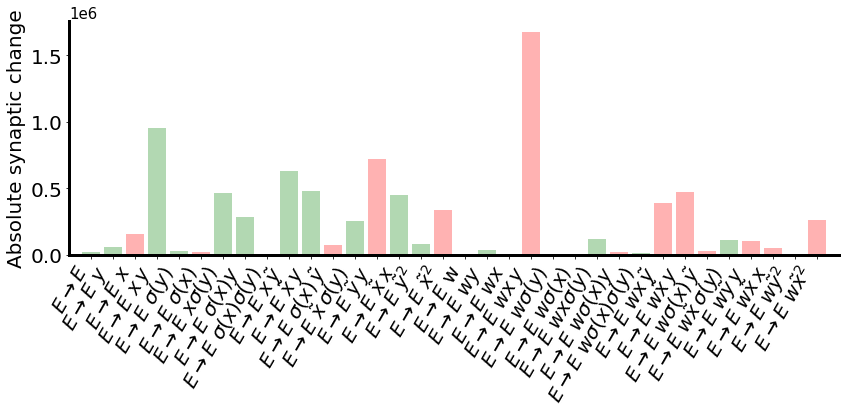

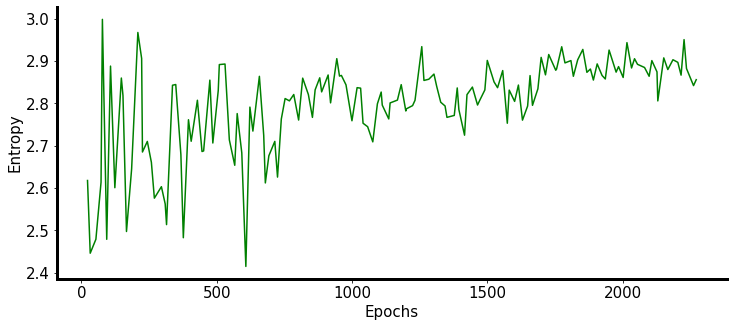

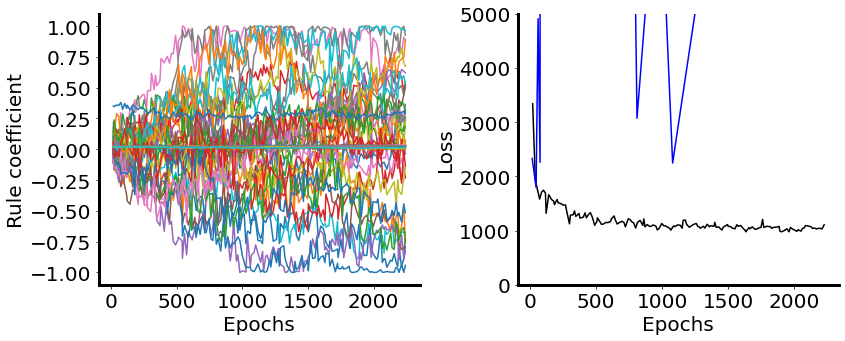

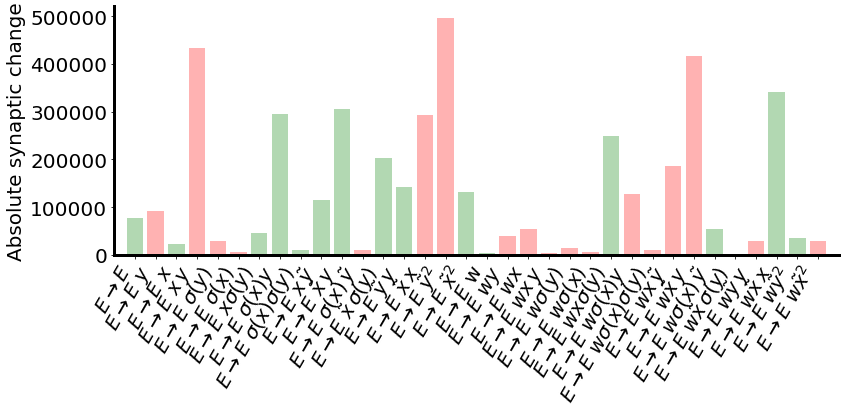

...

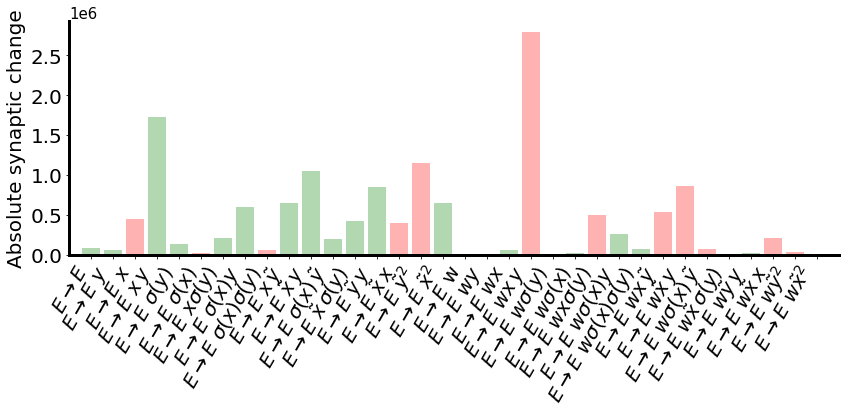

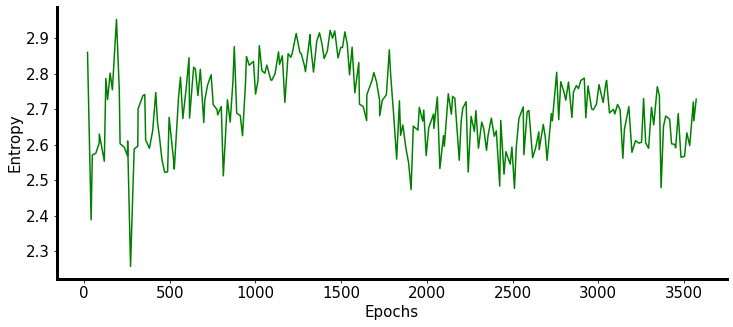

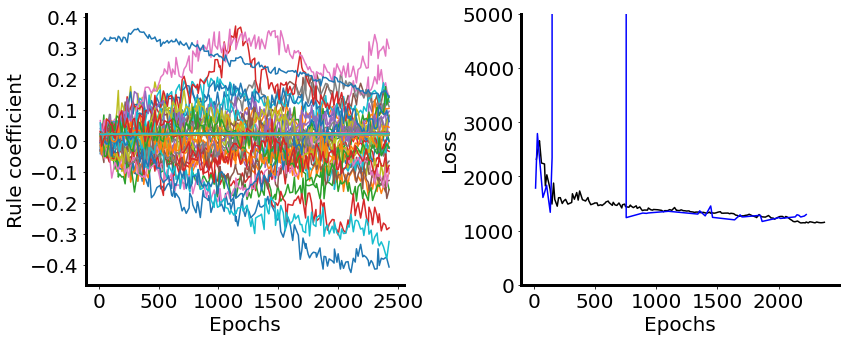

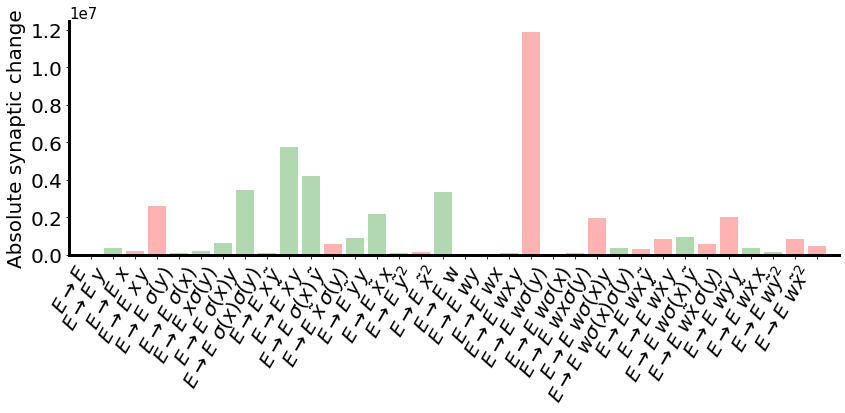

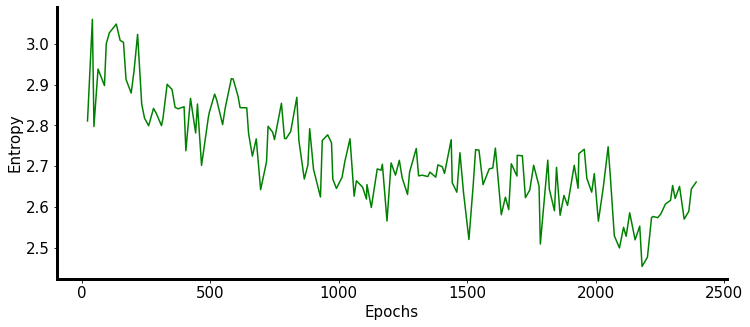

In [4]:
all_files = [
    'decoder_ee_3_extended_bipop_c_5_STD_EXPL_0.03_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7000_2023-08-08_16:56:05.149732',
    'decoder_ee_3_extended_bipop_c_5_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7001_2023-08-08_16:56:57.323355',
    'decoder_ee_3_extended_bipop_c_5_STD_EXPL_0.03_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7003_2023-08-08_17:06:07.978037',
    'decoder_ee_3_extended_bipop_c_5_STD_EXPL_0.03_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7004_2023-08-08_17:06:08.011460',
]

plot_all_opt_runs(all_files, 34, 17, 5, l_thresh=400, n_categories=1, name='ee_unperturbed_fixed_input')

[ 0.37156746  0.01014336 -0.21634843 -0.00407923  0.0115964  -0.22606543
  0.1778043   0.9983991   0.92854219 -0.15945066  0.53023286  0.03095026
 -0.02757782  0.05940194  0.38023003 -0.31575227 -0.2569333  -0.13354464
 -0.26839633 -0.26557554 -0.59094027  0.27680401  0.19480765 -0.34733842
  0.75531556  0.01920935  0.17760929 -0.40627777 -0.36217367 -0.05452822
 -0.68745196 -0.01736043 -0.17395423  0.08204085  0.02430064  0.00806095
  0.02546567  0.02917995  0.02383548  0.03394045  0.02100789  0.02017654
  0.0137758   0.03611513  0.01250947  0.02361043  0.0205538   0.01467136
  0.01703874  0.01374381  0.24750382]
[-0.52602333  0.49374924 -0.94220082  0.00653187 -0.35990709  0.13790694
 -0.87815663 -0.35523302  0.07948543 -0.46808007  0.16907893 -0.095543
 -0.84703088  0.53585602  0.66967532  0.9791774  -0.66679939 -0.59154524
 -0.10649591  0.41198228  0.02758316  0.11374439 -0.57890815 -0.99279063
  0.18790529  0.30122565  0.149038   -0.14924108 -0.32406298  0.07495501
 -0.39091172 -0

ValueError: need at least one array to stack

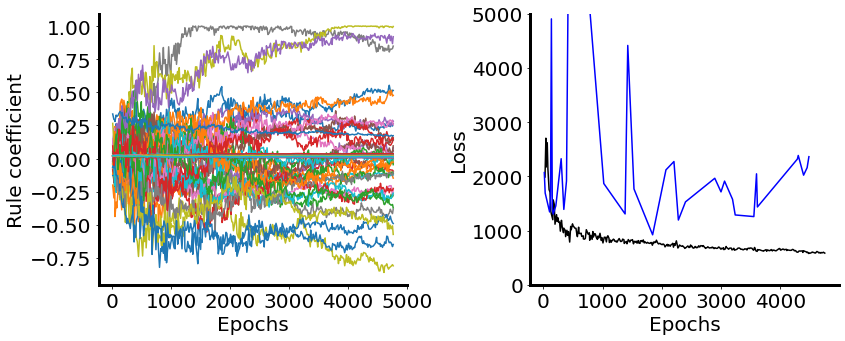

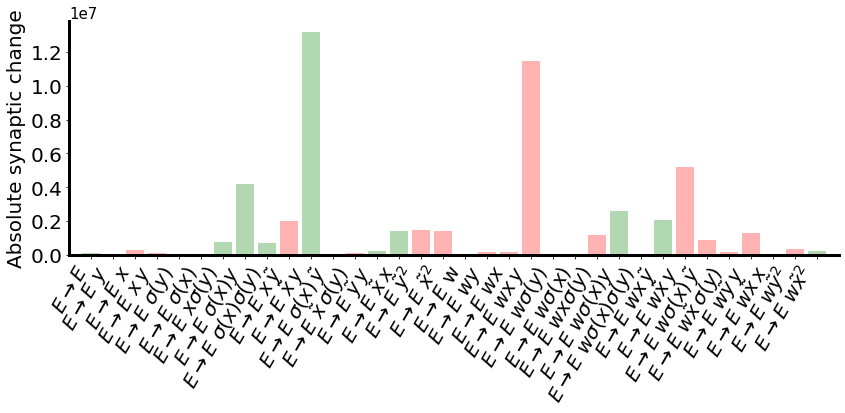

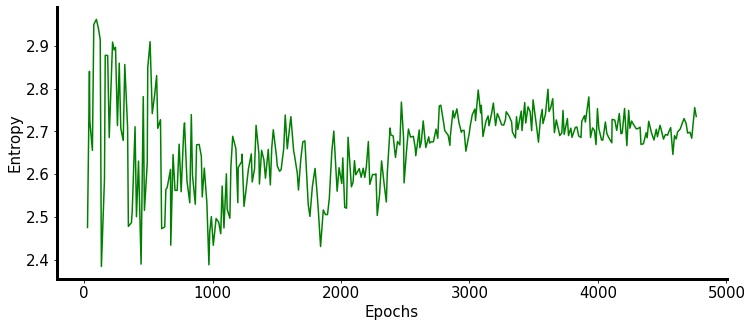

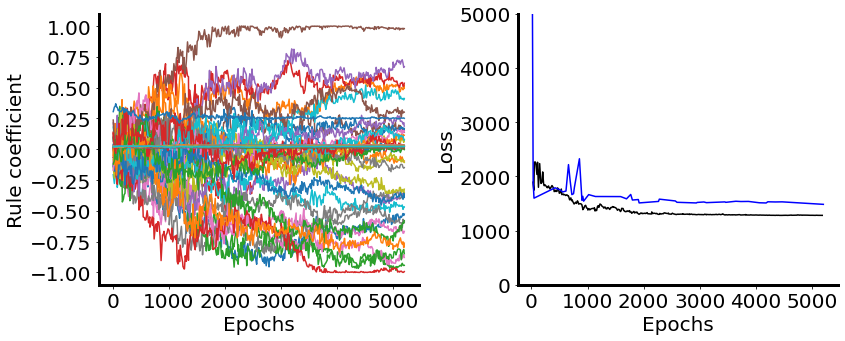

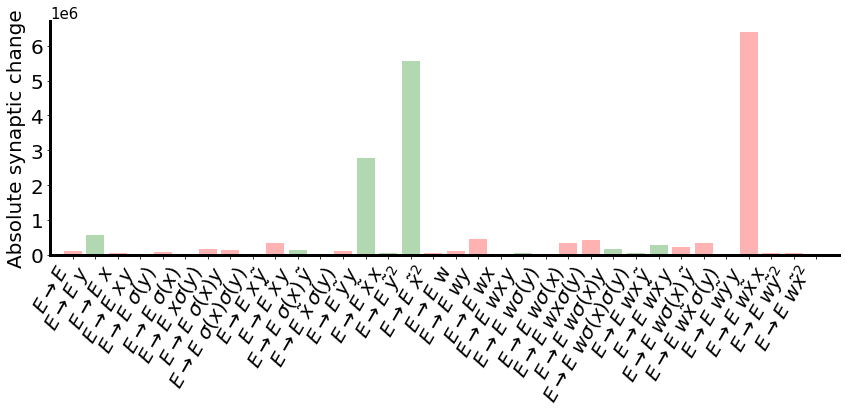

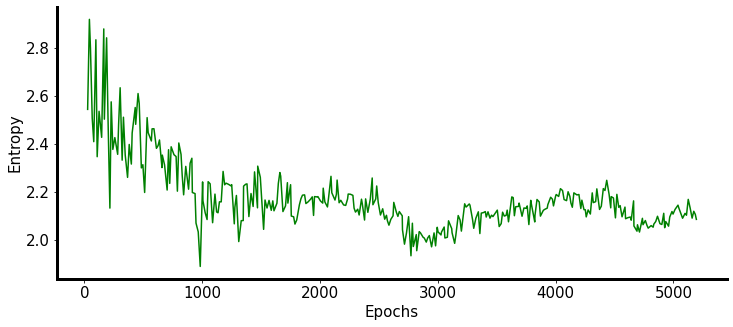

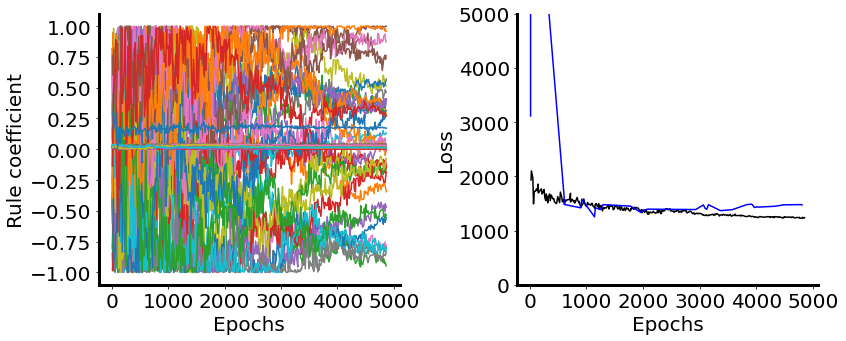

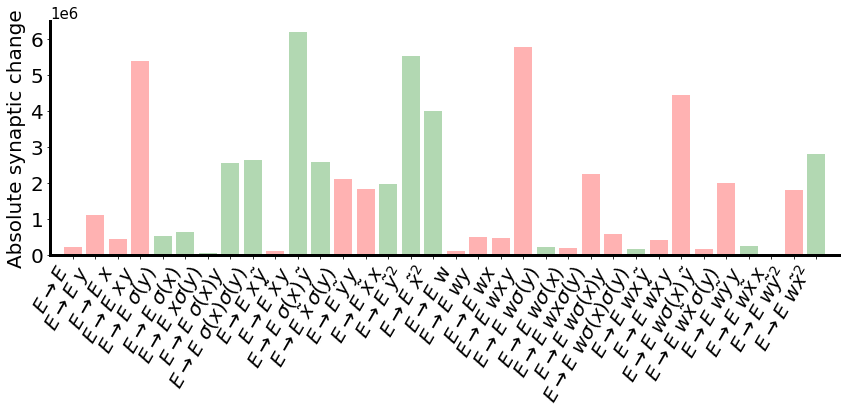

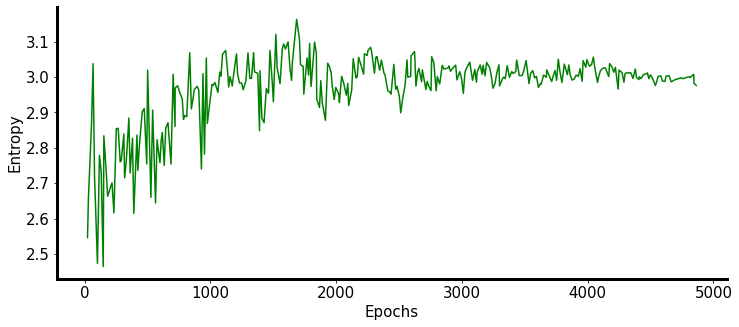

In [7]:
all_files = [
    'decoder_ee_3_extended_bipop_b_5_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6000_2023-08-07_18:21:53.773117',
    'decoder_ee_3_extended_bipop_b_5_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6001_2023-08-07_18:21:24.920061',
    'decoder_ee_3_extended_bipop_b_5_STD_EXPL_0.5_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6000_2023-08-07_18:21:49.412752',
]

plot_all_opt_runs(all_files, 34, 17, 5, l_thresh=400, n_categories=1, name='ee_unperturbed_fixed_input')

[ 1.08040288e-01 -2.58599361e-01  4.69123183e-01 -4.74960251e-01
 -3.46824909e-02  3.45658353e-01  8.96042689e-02  3.26839215e-02
 -2.07604002e-04  6.34950580e-02 -2.65045671e-03  2.48501674e-01
 -8.16976776e-02  4.74587559e-03 -1.37187473e-02  1.24370080e-02
  2.32820658e-01 -7.06323996e-01  2.21556206e-01 -4.22920030e-01
 -8.23880701e-01  7.77190807e-01 -7.05244500e-01  8.17303601e-02
 -1.61782516e-01 -8.44862592e-01 -4.24954076e-01  3.56121299e-01
 -8.02454096e-01 -2.62658370e-01 -9.90878362e-01  6.63593346e-01
  9.80781305e-01 -2.91426291e-01  3.24037611e-02  2.18254322e-02
  3.51014011e-02  1.07346426e-02  3.22805901e-02  3.13392381e-02
  3.64555717e-02  1.87897443e-02  2.75669035e-02  2.58691123e-02
  2.08355851e-02  2.24771800e-02  2.14509830e-02  3.07963188e-02
  5.40267702e-03  1.84818346e-02  6.35092416e-02]
[ 0.32749375 -0.0766402  -0.09959648 -0.12394752 -0.16517553  0.20854495
 -0.22546097 -0.11677539 -0.00385803 -0.0588085  -0.05595586  0.62961325
 -0.22054266 -0.09244181

ValueError: need at least one array to stack

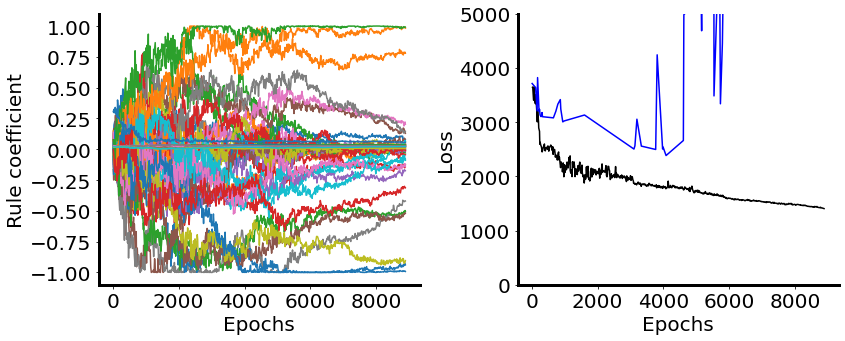

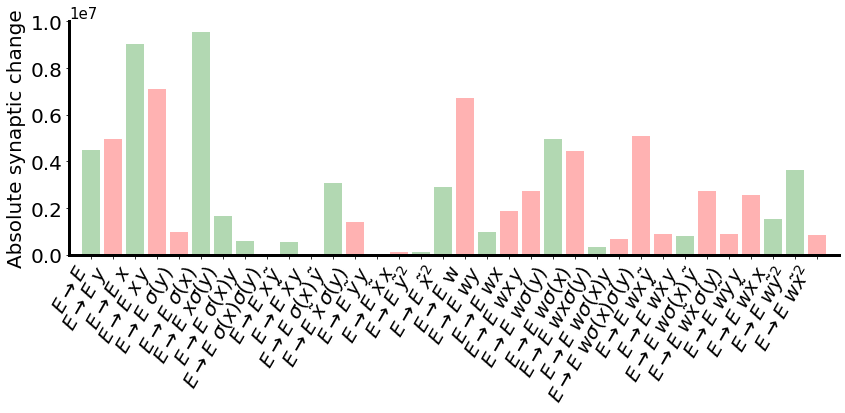

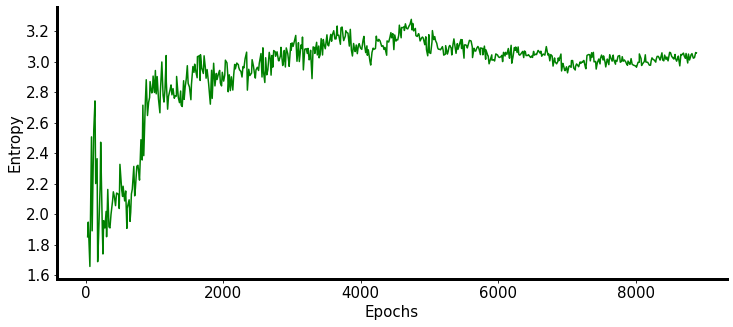

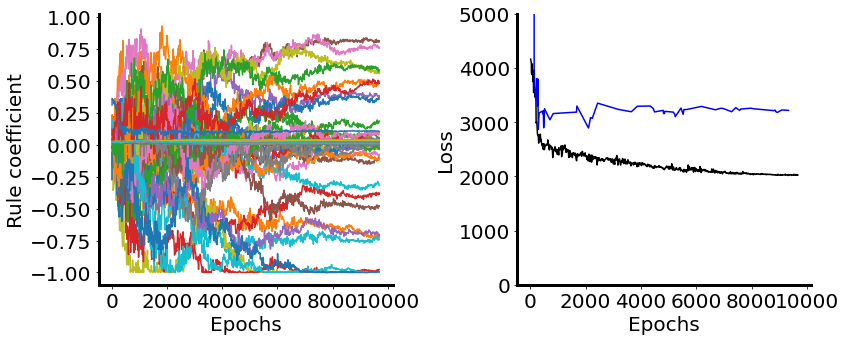

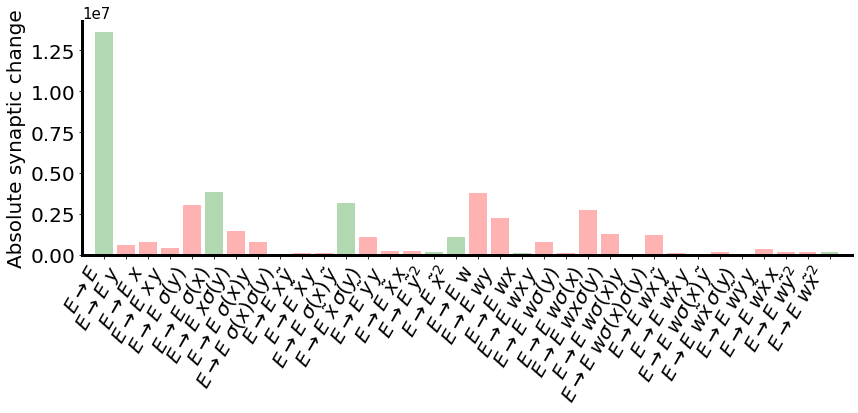

...

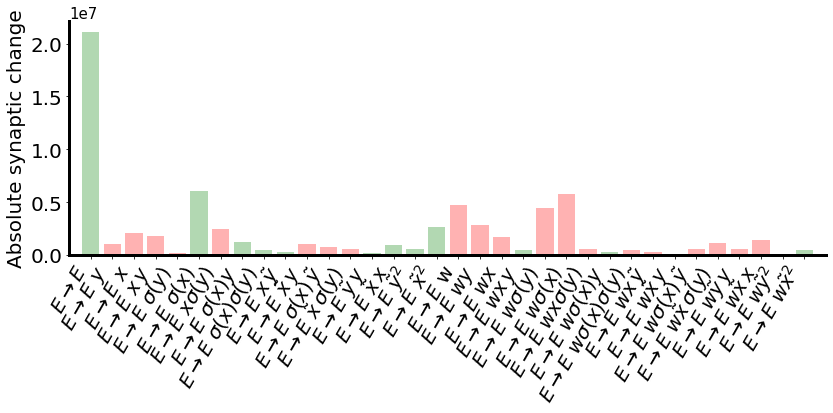

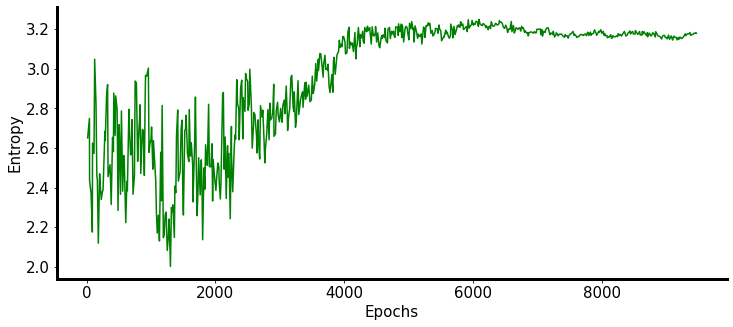

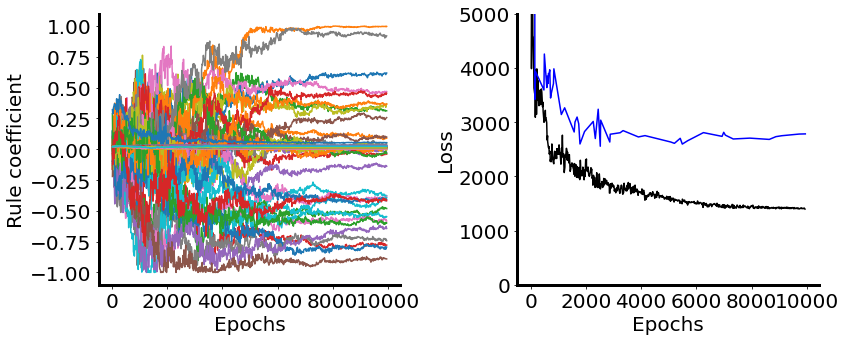

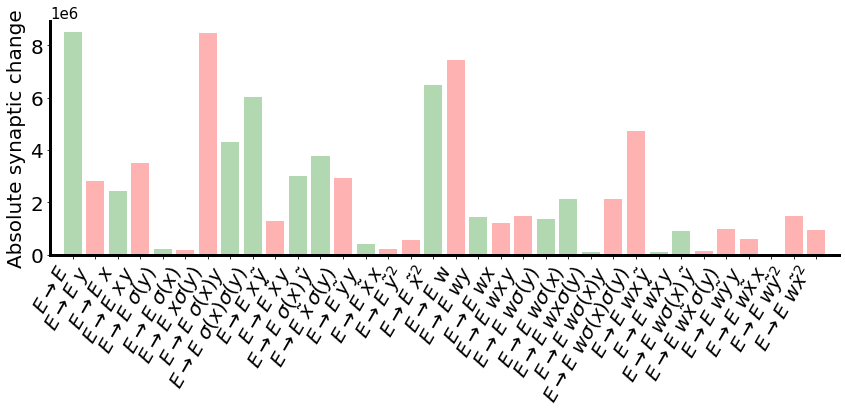

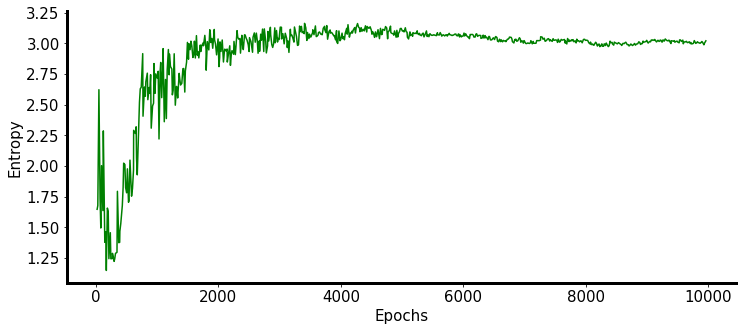

In [9]:
# this run did not include automatic calibration, but did include a penalty for continuing activity at the end of the simulation

all_files = [
    'decoder_ee_3_extended_bipop_10_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7004_2023-08-04_22:27:40.929342',
    'decoder_ee_3_extended_bipop_10_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7005_2023-08-04_22:28:12.844665',
    'decoder_ee_3_extended_bipop_10_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7006_2023-08-04_22:28:51.008008',
    'decoder_ee_3_extended_bipop_10_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7007_2023-08-04_22:29:13.317496',
    'decoder_ee_3_extended_bipop_10_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_7008_2023-08-04_22:29:13.563014',
]

plot_all_opt_runs(all_files, 34, 17, 10, l_thresh=400, n_categories=1, name='ee_unperturbed_fixed_input')

[ 2.29691608e-02  4.03531009e-02 -9.34045598e-01  9.92757875e+01
  2.15502211e-01 -4.86850204e-01 -3.79248772e+00  1.25431282e+01
  7.05994275e+00 -2.70181003e+00  1.11011851e+01 -2.03021682e+00
 -1.45349436e+00 -3.00911802e-02 -3.60818110e-01 -2.76485834e-03
 -2.82852629e-04 -2.58714687e-01 -5.99820291e-01  7.19819505e-01
 -3.26908375e+02  9.22971327e-01 -5.82287813e+00 -1.37620350e+02
 -1.75087579e+01  4.84988114e+01 -6.79331463e+01  6.50379135e+00
 -3.45144037e+00  2.13162686e+00  3.60589536e-01 -1.94878410e-01
  6.84155143e-03 -4.72659566e-02  3.16423728e-02  8.52358948e-03
  1.50092462e-02  1.54057446e-02  1.45667167e-02  2.14430392e-02
  2.27303641e-02  2.46444104e-02  1.27967829e-02  3.01097415e-02
  2.06989169e-02  1.15582506e-02  1.88258879e-02  2.21681490e-02
  3.05430514e-02  2.23366983e-02  2.53435794e-01]
[ 7.28271888e-03  5.31436039e-02  3.65852081e-02  1.39583111e+01
 -1.59718085e-01  3.07664015e-01 -2.82796301e-01  9.07109587e+00
  2.75973902e+00  1.11313441e-01  4.9331

ValueError: need at least one array to stack

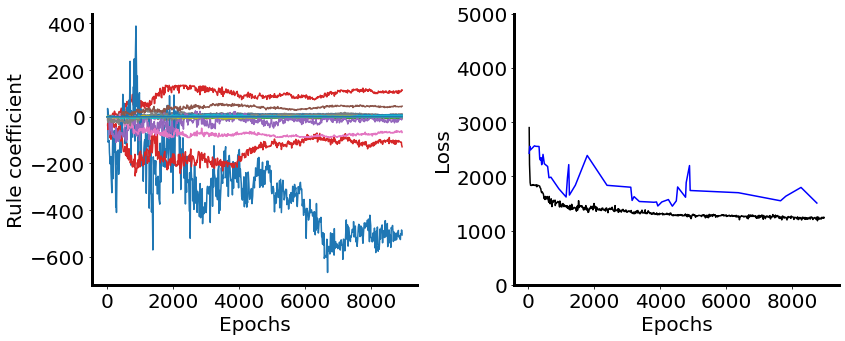

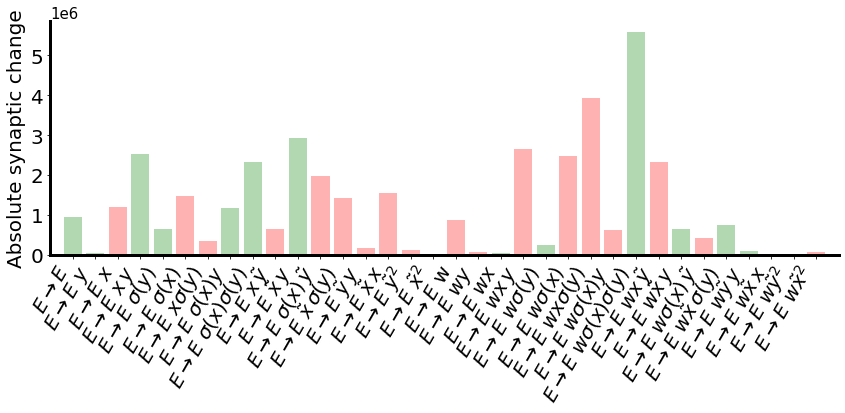

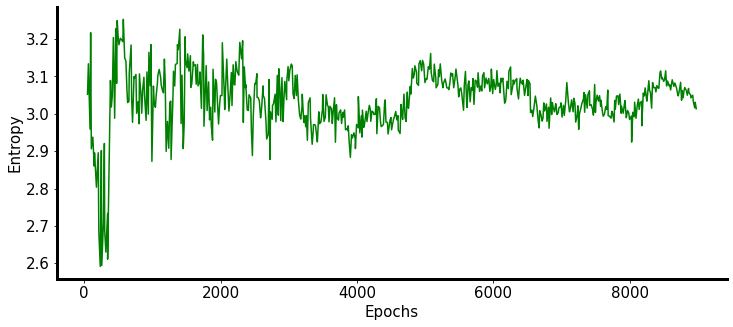

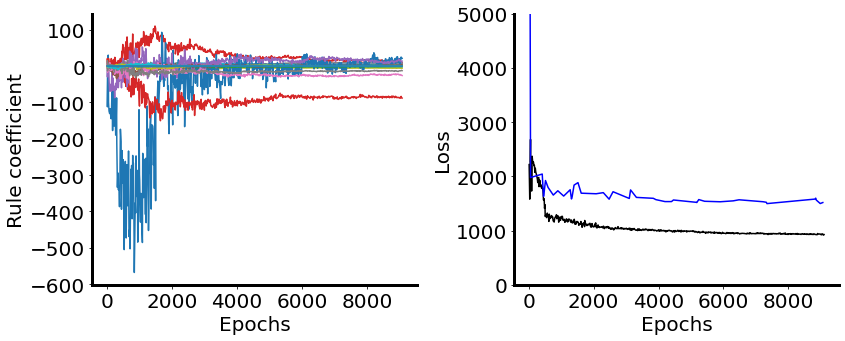

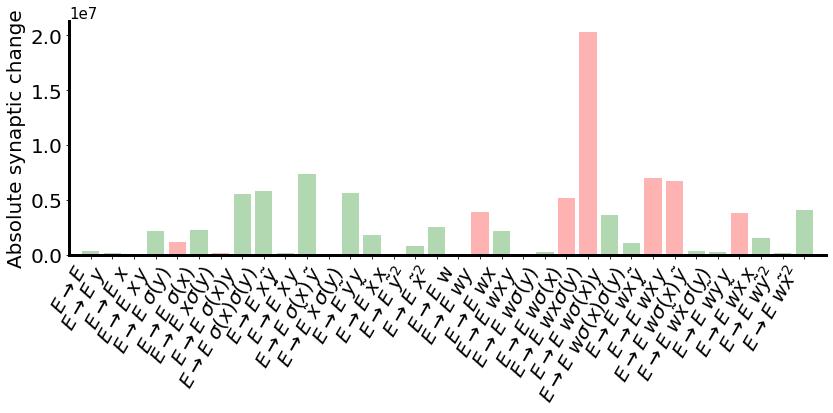

...

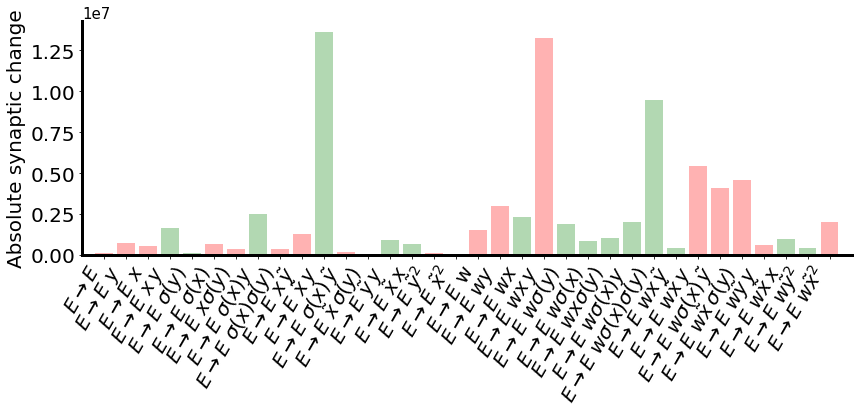

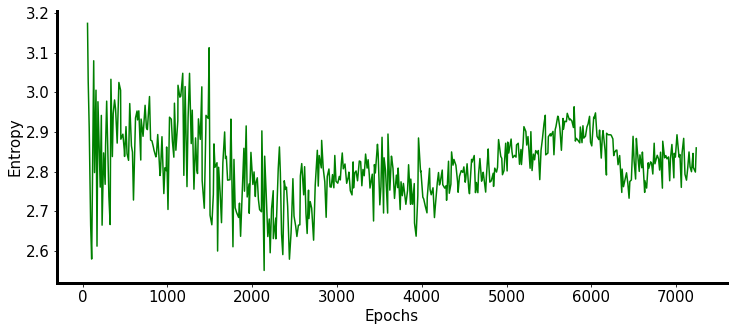

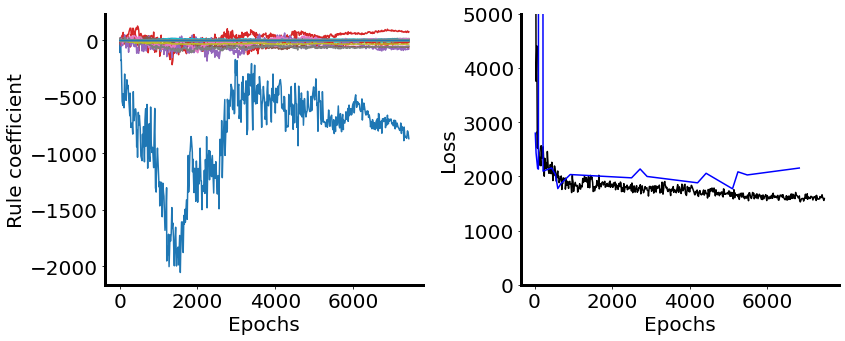

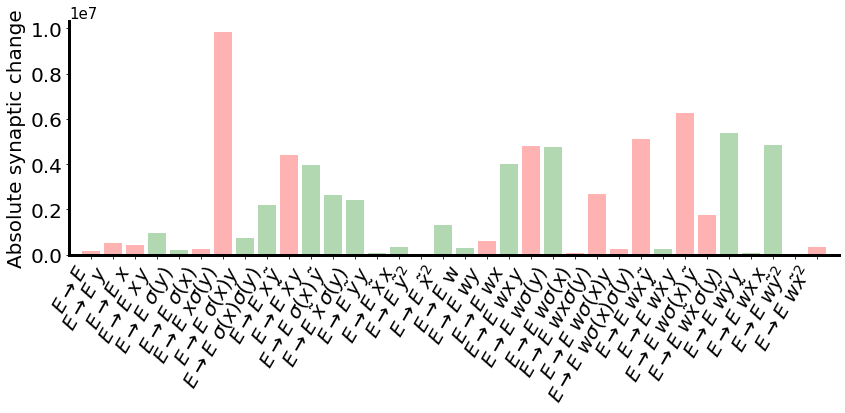

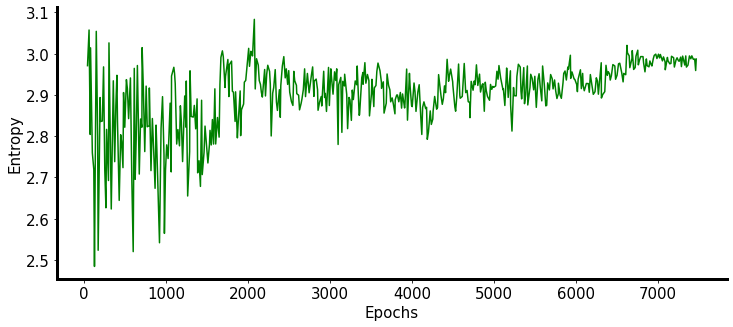

In [10]:
all_files = [
    'decoder_ee_3_indv_cal_5_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6005_2023-08-03_15:47:53.171536',
    'decoder_ee_3_indv_cal_5_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6006_2023-08-03_15:48:41.966417',
    'decoder_ee_3_indv_cal_5_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6007_2023-08-03_16:16:30.389498',
    'decoder_ee_3_indv_cal_5_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6008_2023-08-03_20:32:17.517864',
    'decoder_ee_3_indv_cal_5_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6009_2023-08-03_20:32:17.623078',
]

plot_all_opt_runs(all_files, 34, 17, 5, l_thresh=400, n_categories=1, name='ee_unperturbed_fixed_input')

[ 2.37887436e-02  3.76825224e-01  6.89864397e-01  1.08058787e+00
  3.28297140e-01  1.60892625e-01  1.77429646e-01  3.00780963e+00
 -1.75447243e-02 -3.87212618e-01 -4.81610316e-02 -6.89638493e-02
  2.04865822e-01 -2.44937770e-01 -5.94713716e-02 -2.29168897e-02
  6.74490861e-03 -3.41362548e-02 -3.84342184e-02 -1.68157634e+00
 -4.08187197e-02 -5.79543433e-01 -8.89281680e-02  3.74889167e-01
  6.89242227e-02 -1.05784346e+00  1.35651506e-01 -8.78160249e-02
 -2.42166465e-01  2.44939488e-01  2.76795111e-03 -5.02741192e-01
  3.37875814e-03  7.09367235e-02  3.97948716e-02  3.77179884e-02
  1.76427743e-02  2.77116175e-02  1.24426062e-02  1.35663880e-03
  3.71118915e-02  3.09678863e-02  3.15684282e-02  3.85761921e-02
  3.20904543e-02  1.96265910e-02  3.63714829e-02  2.28066176e-02
  3.02103587e-02  2.38993004e-02  1.38596996e-01]
decoder_ee_3_extended_tunable_ei_5_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6000_2023-07-31_16:14:42.987660
[ 1.21689698

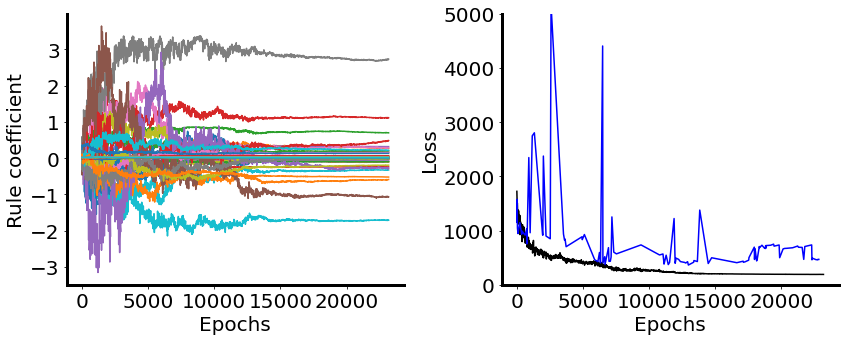

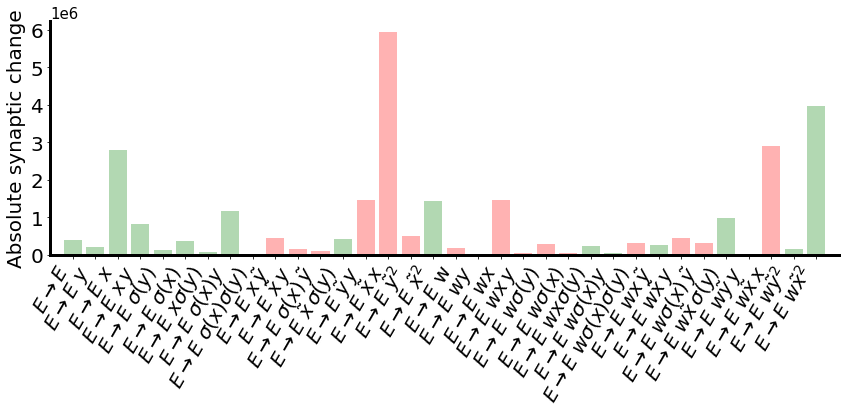

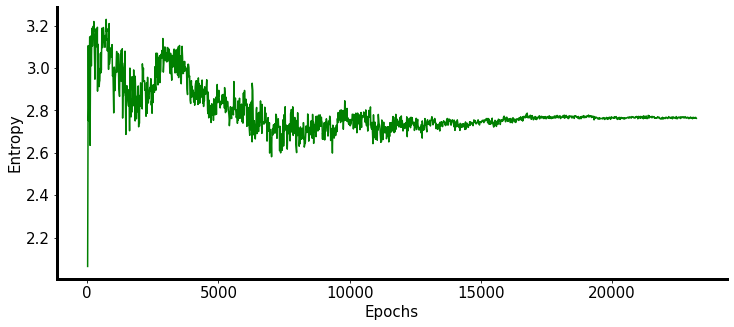

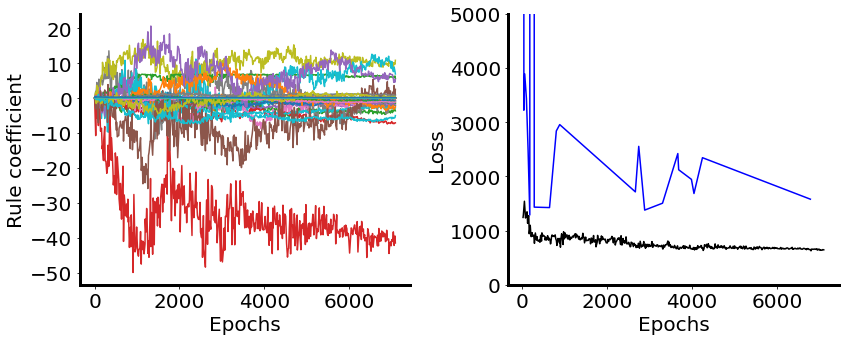

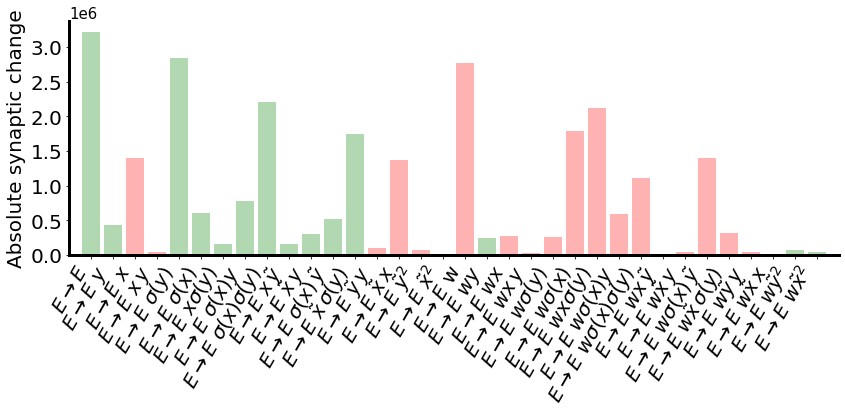

...

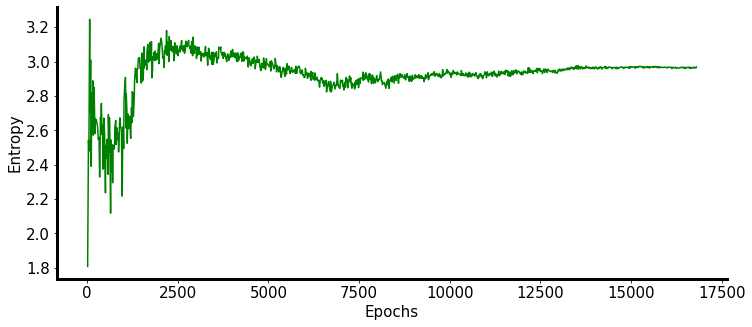

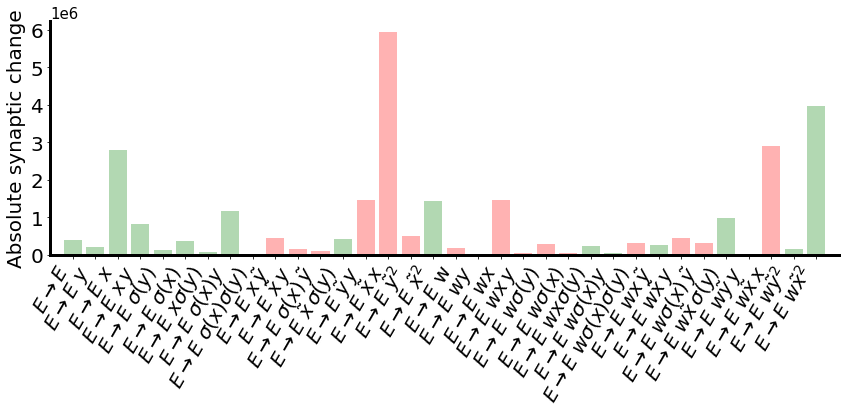

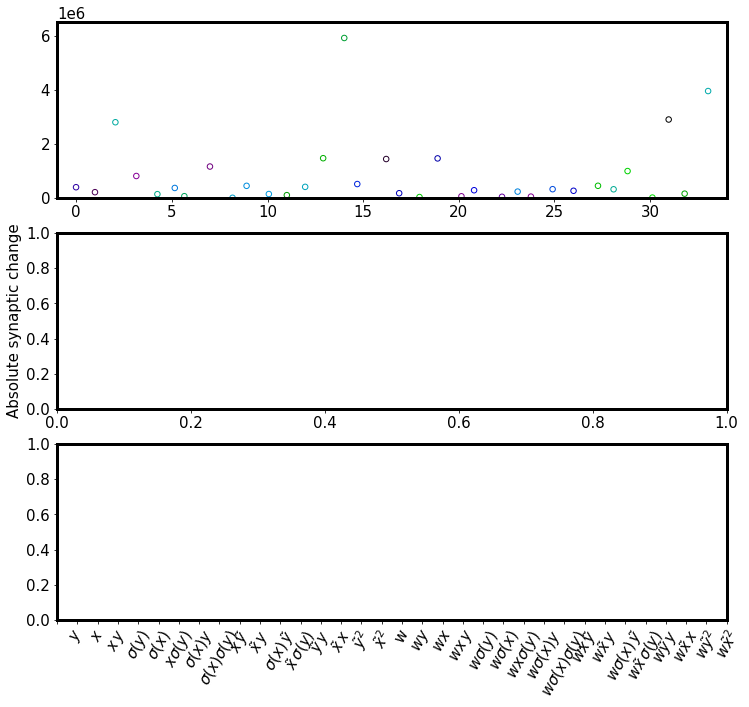

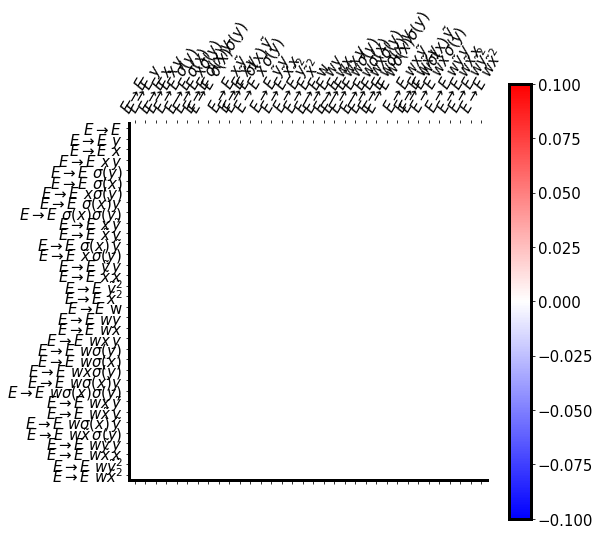

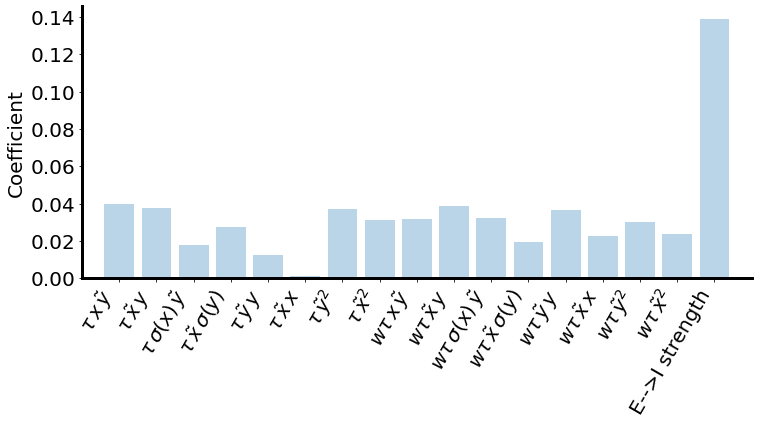

In [5]:
all_files = [
    'decoder_ee_3_extended_tunable_ei_5_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6000_2023-07-31_16:14:42.987660',
    'decoder_ee_3_extended_tunable_ei_5_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6001_2023-07-31_16:14:48.623597',
    'decoder_ee_3_extended_tunable_ei_5_STD_EXPL_0.1_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6002_2023-08-01_06:46:38.898728',
]

plot_all_opt_runs(all_files, 34, 17, 5, l_thresh=400, n_categories=1, name='ee_unperturbed_fixed_input')

UnboundLocalError: local variable 'losses_test' referenced before assignment

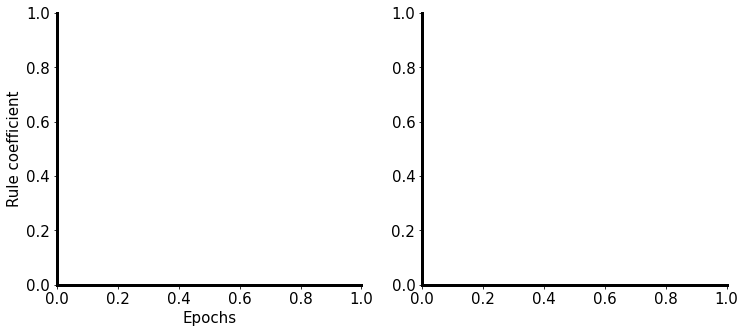

In [27]:
all_files = [
    'decoder_all_small_act_pen_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6000_2023-05-31_10:08:41.348490',
    'decoder_all_small_act_pen_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6001_2023-05-31_10:09:29.557758',
    'decoder_all_small_act_pen_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6002_2023-05-31_10:09:29.595032',
    'seq_self_org_decoder_all_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6004_2023-06-02_23:02:46.161151',
    'seq_self_org_decoder_all_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6005_2023-06-02_23:02:51.021531',
    'seq_self_org_decoder_all_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6006_2023-06-02_23:04:39.747824',
    'seq_self_org_decoder_all_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6007_2023-06-02_23:04:51.469174',
]

plot_all_opt_runs(all_files, 60, 36, 10, l_thresh=500, n_categories=3, name='all_unperturbed')

In [9]:
def load_best_avg_params(file_name, n_plasticity_coefs, n_time_constants, batch_size, n_categories=1):
    figure_path = f'./figures/{file_name}'
    Path(figure_path).mkdir(parents=True, exist_ok=True)
    
    scale = 2
    gs = gridspec.GridSpec(5 * n_categories, 1)
    fig = plt.figure(figsize=(6 * scale, 3 * n_categories * scale), tight_layout=True)
    axs = []
    for i in range(n_categories):
        axs.append([fig.add_subplot(gs[i * 3: i * 3 + 2]), fig.add_subplot(gs[i * 3 + 2:i * 3 + 5])])
        
    gs_2 = gridspec.GridSpec(5 * n_categories, 1)
    fig_2 = plt.figure(figsize=(6 * scale, 3 * n_categories * scale), tight_layout=True)
    axs_2 = []
    for i in range(n_categories):
        axs_2.append([fig_2.add_subplot(gs_2[i * 3: i * 3 + 2]), fig_2.add_subplot(gs_2[i * 3 + 2:i * 3 + 5])])
        
    cutoff = 500
    
    for ax in [axs, axs_2]:
        ax[0][1].set_ylabel('Loss')
        ax[0][0].set_xticks([])
        ax[0][1].set_xticks(np.arange(n_plasticity_coefs + 1))
        ax[0][0].set_xticklabels([])
        ax[0][1].set_xticklabels(np.concatenate([['None'], rule_names[:n_plasticity_coefs]]), rotation=60, ha='right')
        
        ax[0][0].set_yscale('log')
        ax[0][0].set_ylim(100, 1e9)
        ax[0][1].set_ylim(0, cutoff)
        ax[0][0].set_xlim(-1, n_plasticity_coefs + 1)
        ax[0][1].set_xlim(-1, n_plasticity_coefs + 1)
        
        ax[0][0].spines['bottom'].set_visible(False)
        ax[0][0].spines['right'].set_visible(False)
        ax[0][1].spines['top'].set_visible(False)
        ax[0][1].spines['right'].set_visible(False)
        
    
    train_data_path = f'./sims_out/{file_name}/train_data.csv'
    df_train = read_csv(train_data_path, read_header=False)

    syn_effect_start = 2 + batch_size + n_plasticity_coefs + n_time_constants
    syn_effect_end = 2 + batch_size + n_plasticity_coefs + n_time_constants + n_plasticity_coefs
    plasticity_coefs_start = 2 + batch_size
    plasticity_coefs_end = 2 + batch_size + n_plasticity_coefs + n_time_constants

    losses = df_train[df_train.columns[1]]
    
    all_losses_for_dropouts = np.array([losses[i:i + 30] for i in range(0, (n_plasticity_coefs + 1) * 30, 30)])
    mean_losses_for_dropouts = np.array([np.mean(ls) for ls in all_losses_for_dropouts])
    std_losses_for_dropouts = np.array([np.std(ls) for ls in all_losses_for_dropouts])
    cis_for_dropouts = 1.2 * (std_losses_for_dropouts / np.sqrt(30))
    
    sig_diff = np.where(mean_losses_for_dropouts - cis_for_dropouts > mean_losses_for_dropouts[0] + cis_for_dropouts[0], True, False)
    
    means_under_cutoff = mean_losses_for_dropouts < cutoff

    for i in range(0, (n_plasticity_coefs + 1) * 30, 30):
        idx = int(i/30)
        losses_for_dropout = losses[i:i + 30]
        
        color = 'red' if sig_diff[idx] else 'black'
        
        
        under_cutoff = losses_for_dropout < cutoff
        axs[0][0].scatter((np.ones(30) * idx + np.random.normal(size=30, scale=0.15))[~under_cutoff],
                    losses_for_dropout[~under_cutoff], marker='o', facecolor='none', edgecolor=color)
        axs[0][1].scatter((np.ones(30) * idx + np.random.normal(size=30, scale=0.15))[under_cutoff],
                    losses_for_dropout[under_cutoff], marker='o', facecolor='none', edgecolor=color)
    
    
        if not means_under_cutoff[idx]:
            axs_2[0][0].errorbar([idx],
                        mean_losses_for_dropouts[idx],
                        yerr=cis_for_dropouts[idx], color=color, capsize=4, linestyle='')
            axs_2[0][0].scatter([idx],
                        mean_losses_for_dropouts[idx], color=color)
        else:
            axs_2[0][1].errorbar([idx], 
                        mean_losses_for_dropouts[idx],
                        yerr=cis_for_dropouts[idx], color=color, capsize=4, linestyle='')
            axs_2[0][1].scatter([idx],
                        mean_losses_for_dropouts[idx], color=color)
    
    set_font_size(axs[0][0], 20)
    set_font_size(axs[0][1], 20)
    fig.savefig(os.path.join(figure_path, 'rule_perturbation.png'))
    fig.savefig(os.path.join(figure_path, 'rule_perturbation.svg'))
        

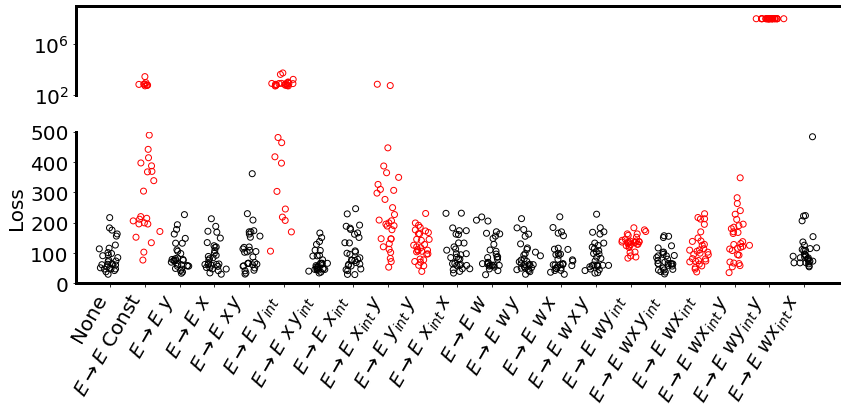

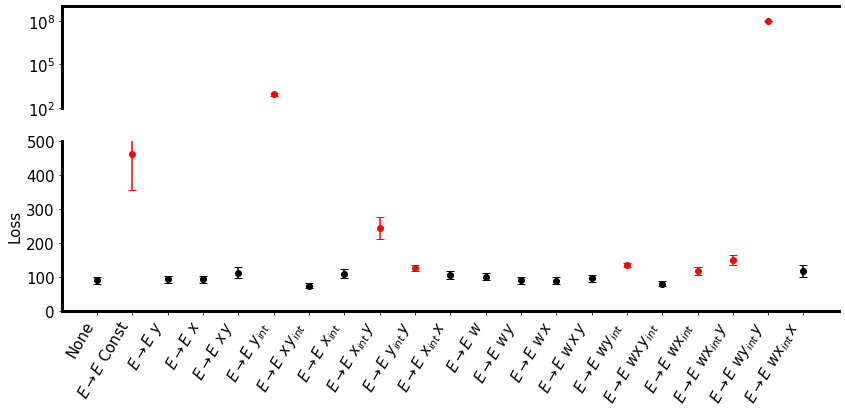

In [10]:
file_name = 'ee_no_syn_perturb_decoder_all_1_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_100_2023-06-07_15:34:37.394496'
load_best_avg_params(file_name, 20,12, 1, n_categories=1)

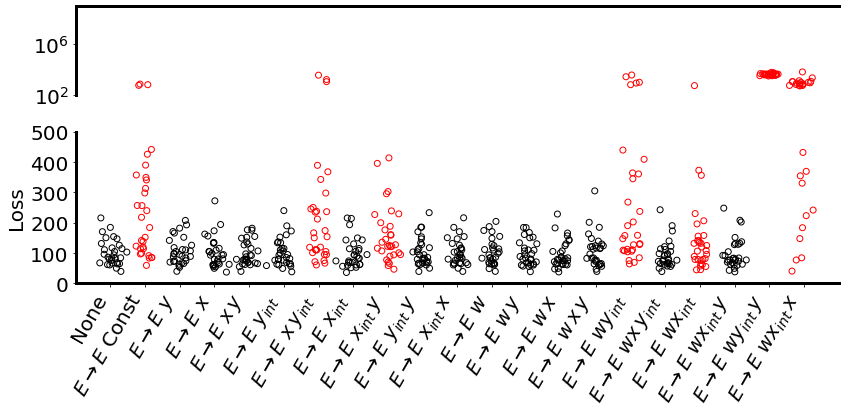

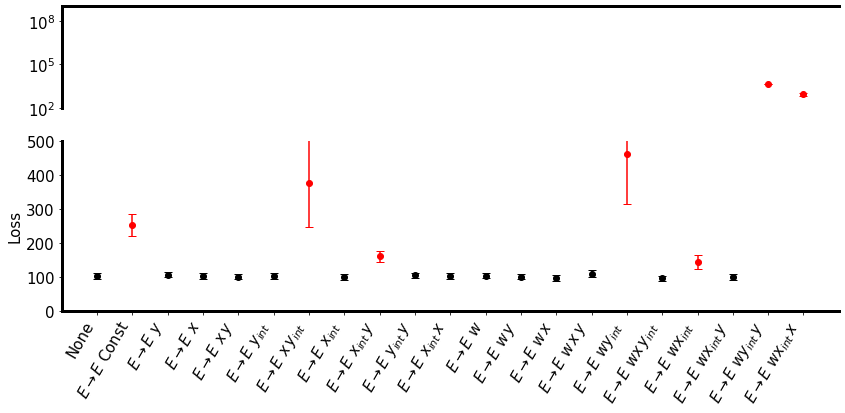

In [8]:
file_name = 'ee_syn_perturb_decoder_all_1_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.001_FRACI_0.75_SEED_100_2023-06-08_12:18:31.272425'
load_best_avg_params(file_name, 20,12, 1, n_categories=1)

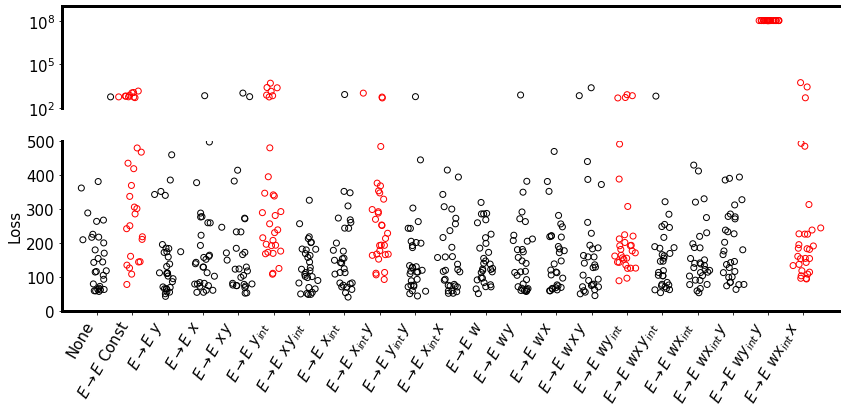

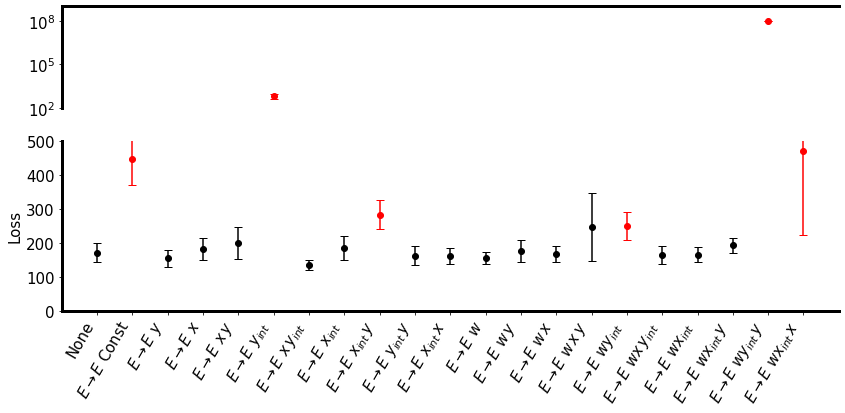

In [43]:
file_name = 'ee_syn_perturb_ns_train_decoder_all_1_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.001_FRACI_0.75_SEED_100_2023-06-08_12:27:37.371587'
load_best_avg_params(file_name, 20,12, 1, n_categories=1)

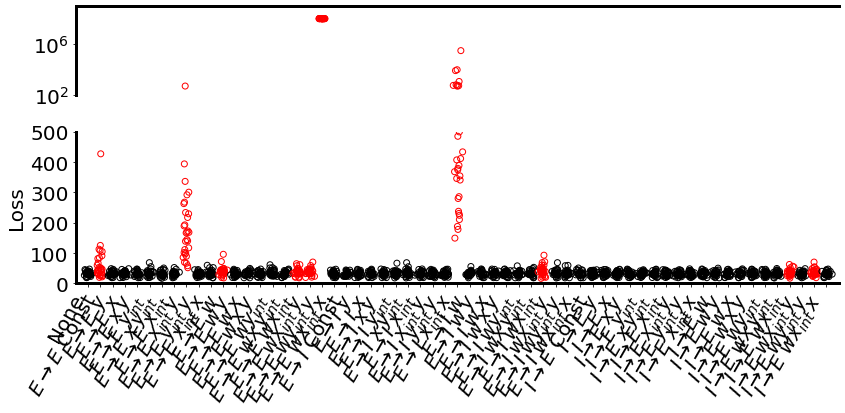

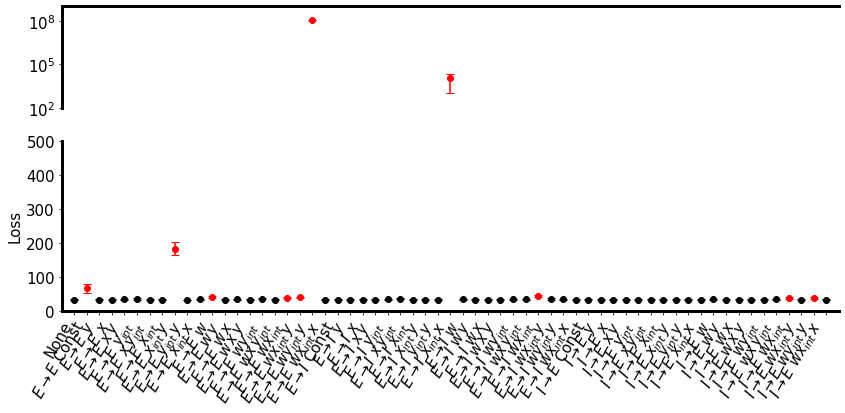

In [5]:
file_name = 'ei_test_decoder_all_1_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_100_2023-06-11_00:44:22.883486'
load_best_avg_params(file_name, 60, 36, 1, n_categories=1)
